# Waveform with Deep Learning

## **Introduction**

Seismic waveform inversion is a fundamental problem in geophysics, aiming to infer subsurface velocity structures from recorded waveforms generated by seismic sources. Accurately estimating these velocity maps is critical for applications such as resource exploration, earthquake modeling, and subsurface imaging. While traditional inversion techniques often rely on physics-based iterative solvers, recent advances in deep learning have introduced data-driven alternatives that promise faster and potentially more robust solutions.

In this project, we explore a deep learning approach to seismic inversion using a large-scale synthetic dataset of full waveform recordings and their corresponding 2D velocity models. Each input sample consists of a five-shot waveform recording over 1000 receivers and 70 time steps, representing how a seismic wave propagates through various subsurface configurations. The corresponding output is a 70×70 velocity map that models the underlying material properties of the earth.

Our exploratory data analysis (EDA) confirms that this problem is inherently temporal: the waveform data captures amplitude variation over time at fixed spatial locations, and wavefronts evolve smoothly as seismic energy disperses across the medium. We further observe that the complexity of the subsurface—ranging from simple, flat-layered structures to highly heterogeneous and faulted regions—directly influences waveform dynamics. This relationship is evident in both structural metrics such as total variation and layer counts, and in temporal behavior measured via PCA trajectories and correlation entropy.

To address the challenge of learning from both simple and complex geological structures, we incorporate physics-informed loss functions into our training pipeline. These constraints, such as total variation regularization, help enforce smooth and physically plausible outputs. However, our analysis highlights a critical tradeoff: while such losses are beneficial for clean, layered datasets, they may oversmooth or erase essential high-frequency details in more complex domains. As a result, we propose an adaptive training strategy informed by EDA-driven complexity scores.

In the following sections, we present our EDA results, describe the model architecture and training pipeline, evaluate the impact of physics-based constraints, and discuss future opportunities for combining data-driven and physics-based inversion methods.


#Data Citation

Youzuo Lin, Lu Lu, Walter Reade, Addison Howard, Maria Cruz, Ashley Chow, and Yale-UNC Data-Driven Full Waveform Inversion. Yale/UNC-CH - Geophysical Waveform Inversion. https://kaggle.com/competitions/waveform-inversion, 2025. Kaggle.

#Acknowledgements
Some parts of the model design and implementation were guided with the assistance of ChatGPT (OpenAI, 2025), an AI language model. Suggestions for loss function composition and model structuring were adapted and refined for this project.

In [2]:
!pip install tensorflow==2.18.0
!pip install tensorflow-tpu==2.18.0 --find-links=https://storage.googleapis.com/libtpu-tf-releases/index.html


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.4/615.4 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 162.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 119.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 177.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 179.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 185.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 7.4 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml_dtypes 0.5.1
    Uninstalling ml_dtypes-0.5.1:
      Successfully uninstalled ml_dtypes-0.5.1
Looking in links: https://storage.googleapis.com/libtpu-tf-releases/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 859.9 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 101.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 127.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 140.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 147.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 6.8 MB/s eta 0:00:00


In [2]:
import zipfile
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from IPython.display import display
from sklearn.decomposition import PCA
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from tensorflow.keras import backend as K

from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

work_dir = "/content/drive/MyDrive/CU/waveform-data/full_waveform_dataset/train_samples"


In [4]:
strategy = None
try:
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='local')
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    strategy = tf.distribute.TPUStrategy(resolver)
    print("TPU initialized successfully.")
except ValueError as e:
    print("TPU not found. Falling back to CPU/GPU.")
    strategy = tf.distribute.get_strategy()

TPU initialized successfully.


In [3]:
vel_style_family_data = ['CurveVel_A','CurveVel_B','FlatVel_A','FlatVel_B','Style_A','Style_B']
fault_family_data = ['CurveFault_A','CurveFault_A','FlatFault_A']
fault_family_file_names_X= ['seis2_1_0.npy','seis4_1_0.npy']
fault_family_file_names_y= ['vel2_1_0.npy','vel4_1_0.npy']
fault_family_data_b = ['FlatFault_B']
fault_family_file_names_X_b= ['seis6_1_0.npy','seis8_1_0.npy']
fault_family_file_names_y_b= ['vel6_1_0.npy','vel8_1_0.npy']

data_file_list= [
    ['CurveVel_A','data/data1.npy','model/model1.npy','easy'],
    ['CurveVel_B','data/data1.npy','model/model1.npy','easy'],
    ['FlatVel_A','data/data1.npy','model/model1.npy','easy'],
    ['FlatVel_B','data/data1.npy','model/model1.npy','easy'],
    ['Style_A','data/data1.npy','model/model1.npy','easy'],
    ['Style_B','data/data1.npy','model/model1.npy','easy'],
    ['CurveFault_A','seis2_1_0.npy','vel2_1_0.npy','medium'],
    ['CurveFault_A','seis4_1_0.npy','vel4_1_0.npy','medium'],
    ['CurveFault_B','seis6_1_0.npy','vel6_1_0.npy','medium'],
    ['CurveFault_B','seis8_1_0.npy','vel8_1_0.npy','medium'],
    ['FlatFault_A','seis2_1_0.npy','vel2_1_0.npy','medium'],
    ['FlatFault_A','seis4_1_0.npy','vel4_1_0.npy','medium'],
    ['FlatFault_B','seis6_1_0.npy','vel6_1_0.npy','medium'],
    ['FlatFault_B','seis8_1_0.npy','vel8_1_0.npy','medium']
]


## **Exploratory Data Analysis (EDA)**

To guide model development and understand the underlying structure of our dataset, we conducted exploratory data analysis (EDA) focusing on both the input waveforms and the output velocity maps. The goal of this analysis is to assess the temporal, spatial, and structural characteristics of the data, uncover patterns related to geological complexity, and inform decisions around model architecture, regularization, and loss design.

### **Waveform Analysis**

Each sample in our dataset consists of multi-shot waveform recordings with dimensions (5 shots, 1000 receivers, 70 time steps). To investigate the temporal evolution of seismic wavefronts, we conducted the following analyses:

* **Wavefront snapshots**: We visualized amplitude profiles at selected time steps to examine how seismic energy propagates across receivers.
* **Heatmaps of waveform evolution**: These provided a global view of the wavefront's movement through space and time, revealing coherence or scattering patterns.
* **PCA on time-step embeddings**: This reduced the high-dimensional waveform data to a low-dimensional trajectory, allowing us to assess the smoothness and progression of temporal patterns.
* **Correlation matrices between time steps**: We quantified temporal consistency in wavefront behavior, using entropy as a proxy for waveform complexity.

### **Velocity Map Analysis**

Each target output is a 70x70 2D velocity model representing the subsurface. We analyzed these outputs to understand their structural complexity:

* **Total Variation (TV)**: This metric captured the spatial smoothness or roughness of the velocity maps, helping distinguish between simple layered media and geologically complex regions.
* **Estimated Layer Count**: By examining vertical gradients, we estimated the number of distinct velocity layers in each map.
* **Descriptive statistics**: We computed velocity mean, standard deviation, and range to capture distributional differences across datasets.

### **Dataset Comparison and Insights**

We aggregated EDA metrics across all 13 datasets to compare structural and temporal complexity. Key findings include:

* **Simpler datasets** (e.g., `FlatVel_A`, `FlatFault_A`) show low TV, fewer layers, and more coherent wavefront evolution.
* **Complex datasets** (e.g., `Style_B`, `CurveFault_B`) exhibit high total variation, many layers, and temporally irregular wavefronts with high correlation entropy.

### **Data Cleanliness**

The dataset used in this project is synthetically generated and comes well-structured, with no missing values, invalid entries, or inconsistencies across samples. Each sample includes complete waveform recordings and a corresponding velocity map, ensuring alignment between input and target data. Given the controlled nature of the dataset, no additional cleaning, outlier removal, or imputation was required. This allowed us to focus directly on exploratory analysis, model design, and training strategies without needing to address data quality issues.

,Dataset,Complexity,#Samples,X Shape,Y Shape,Amp Mean,Amp Std,Amp Min,Amp Max,Vel Mean,Vel Std,Vel Min,Vel Max,TV Score
0,CurveVel_A,easy,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",-0.000084,1.332585,-25.192156,48.882092,2810.239990,793.479736,1502.000000,4498.000000,48.468452
1,CurveVel_B,easy,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",-0.000179,1.578878,-27.159319,53.743347,2962.821533,859.612915,1506.000000,4496.000000,118.282867
2,FlatVel_A,easy,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",-0.000041,1.326492,-24.356365,47.088478,2753.507812,771.019775,1507.000000,4500.000000,27.001715
3,FlatVel_B,easy,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",-0.000273,1.604853,-27.104969,53.232094,2977.180664,816.189270,1507.000000,4492.000000,60.484142
4,Style_A,easy,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",0.000256,1.301266,-24.407917,47.598297,2720.740479,650.623474,1535.398804,4396.863770,83.586365
5,Style_B,easy,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",0.000158,1.279061,-22.671999,43.549953,2808.751953,620.627380,1561.792114,4381.254395,121.006821
6,CurveFault_A,medium,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",-0.000472,1.397717,-25.728420,50.028992,3084.172119,852.889648,1516.000000,4481.000977,34.880894
7,CurveFault_A,medium,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",-0.000285,1.340799,-24.435240,47.258083,3006.983887,858.404175,1502.000000,4500.000000,44.780285
8,CurveFault_B,medium,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",-0.000140,1.316400,-24.474295,47.699467,2967.895508,877.095154,1501.000000,4495.000000,107.482773
9,CurveFault_B,medium,500,"(500, 5, 1000, 70)","(500, 1, 70, 70)",-0.000028,1.321851,-24.116009,46.640350,2978.240723,872.876160,1510.000000,4496.000000,110.957146


Saved combined EDA image to: combined_eda_summary.png


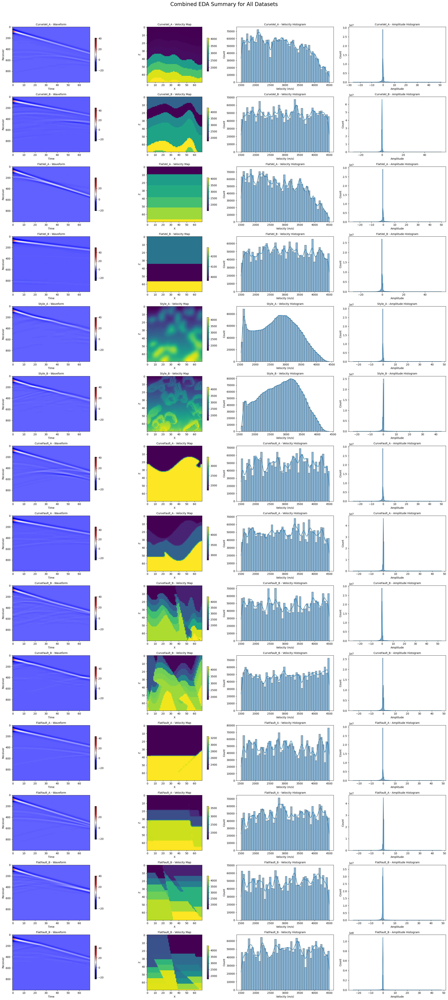

In [ ]:


def generate_eda_stats_table(X_, y_, dataset_name="Unnamed", complexity="unknown"):
    # Use only the first 100 samples
    X = X_[:100]
    y = y_[:100]

    amp = X[:, 0]  # Use first shot
    vel = y[:, 0]

    # Compute statistics
    stats = {
        "Dataset": dataset_name,
        "Complexity": complexity,
        "#Samples": X_.shape[0],
        "X Shape": str(X_.shape),
        "Y Shape": str(y_.shape),
        "Amp Mean": np.mean(amp),
        "Amp Std": np.std(amp),
        "Amp Min": np.min(amp),
        "Amp Max": np.max(amp),
        "Vel Mean": np.mean(vel),
        "Vel Std": np.std(vel),
        "Vel Min": np.min(vel),
        "Vel Max": np.max(vel),
    }

    # Total Variation (TV) of the velocity maps
    tv = np.sum(np.abs(np.diff(vel, axis=2))) + np.sum(np.abs(np.diff(vel, axis=1)))
    stats["TV Score"] = tv / (vel.shape[0] * vel.shape[1] * vel.shape[2])

    return pd.DataFrame([stats])

combined_eda_df = pd.DataFrame()
n_datasets = len(data_file_list)
fig, axs = plt.subplots(n_datasets, 4, figsize=(24, 4 * n_datasets))
fig.suptitle("Combined EDA Summary for All Datasets", fontsize=20)
output_path='combined_eda_summary.png'

for idx, (dataset_name, x_file, y_file, complexity) in enumerate(data_file_list):
  try:
    x_path = os.path.join(work_dir, dataset_name, x_file)
    y_path = os.path.join(work_dir, dataset_name, y_file)
    X = np.load(x_path, mmap_mode='r')
    y = np.load(y_path, mmap_mode='r')
    df = generate_eda_stats_table(X, y, dataset_name, complexity)
    combined_eda_df = pd.concat([combined_eda_df, df], ignore_index=True)

    waveform = X[0, 0, :, :]
    velocity_map = y[0, 0, :, :]
    all_vel_vals = y[:, 0].flatten()
    all_amp_vals = X[:, 0].flatten()

    # Waveform
    im1 = axs[idx, 0].imshow(waveform, aspect='auto', cmap='seismic')
    axs[idx, 0].set_title(f"{dataset_name} - Waveform", fontsize=10)
    axs[idx, 0].set_xlabel("Time")
    axs[idx, 0].set_ylabel("Receiver")
    fig.colorbar(im1, ax=axs[idx, 0], shrink=0.6)

    # Velocity map
    im2 = axs[idx, 1].imshow(velocity_map, cmap='viridis')
    axs[idx, 1].set_title(f"{dataset_name} - Velocity Map", fontsize=10)
    axs[idx, 1].set_xlabel("X")
    axs[idx, 1].set_ylabel("Z")
    fig.colorbar(im2, ax=axs[idx, 1], shrink=0.6)

    # Velocity histogram
    sns.histplot(all_vel_vals, bins=50, kde=True, ax=axs[idx, 2])
    axs[idx, 2].set_title(f"{dataset_name} - Velocity Histogram", fontsize=10)
    axs[idx, 2].set_xlabel("Velocity (m/s)")
    axs[idx, 2].set_ylabel("Count")

    # Amplitude histogram
    sns.histplot(all_amp_vals, bins=100, kde=True, ax=axs[idx, 3])
    axs[idx, 3].set_title(f"{dataset_name} - Amplitude Histogram", fontsize=10)
    axs[idx, 3].set_xlabel("Amplitude")
    axs[idx, 3].set_ylabel("Count")
  except Exception as e:
    print(f"Error processing {dataset_name}: {e}")
    for j in range(4):
      axs[idx, j].axis('off')
      axs[idx, 0].text(0.5, 0.5, f"Error loading {dataset_name}:\n{e}", ha='center', va='center', fontsize=12)


display(combined_eda_df)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
fig.savefig(output_path, dpi=150)
print(f"Saved combined EDA image to: {output_path}")

In [ ]:
image_drive_path = os.path.join(work_dir,output_path)
fig.savefig(image_drive_path, dpi=150)



# Analysis

1. Amplitude Statistics (Input Waveform):
- **Amplitude Mean:** ~0 in all datasets
- **Amplitude Standard Deviation:** ~1.3 - 1.6, across datasets
- **Amplitude Range:** Min ~-27, Max ~53 consistent across data ranges.

2. Velocity Maps Characteristics: Most datasets around 2800-3100 m/s
- **Mean and Standard Deviation of Velocity**:
  - FlatVel_B has the highest mean (2977 m/s) and lowest variability (816 m/s)
  - Style_B and Style_A have lower means and lower velocity variation, but their TV scores are high
- Min & Max Velocity: Min values are always ~ 1500 m/s, max values ~4480 - 4500 m/s

3. Total Variation (TV Score): this tells us about physical complexity
- Low TV Score (<50): FlatFault_A, FlatVel_A, CurveFault_A - these are clean layered velocity maps
- High TV Score (>100): Style_B, CurveVel_B, CurveFault_B - complex structures, curved
- Style_A: has the moddiel ground with a TV score of 83

Processing CurveVel_A
Processing CurveVel_B
Processing FlatVel_A
Processing FlatVel_B
Processing Style_A
Processing Style_B
Processing CurveFault_A
Processing CurveFault_A
Processing CurveFault_B
Processing CurveFault_B
Processing FlatFault_A
Processing FlatFault_A
Processing FlatFault_B
Processing FlatFault_B
Combined waveform image saved to: combined_waveform_analysis.png


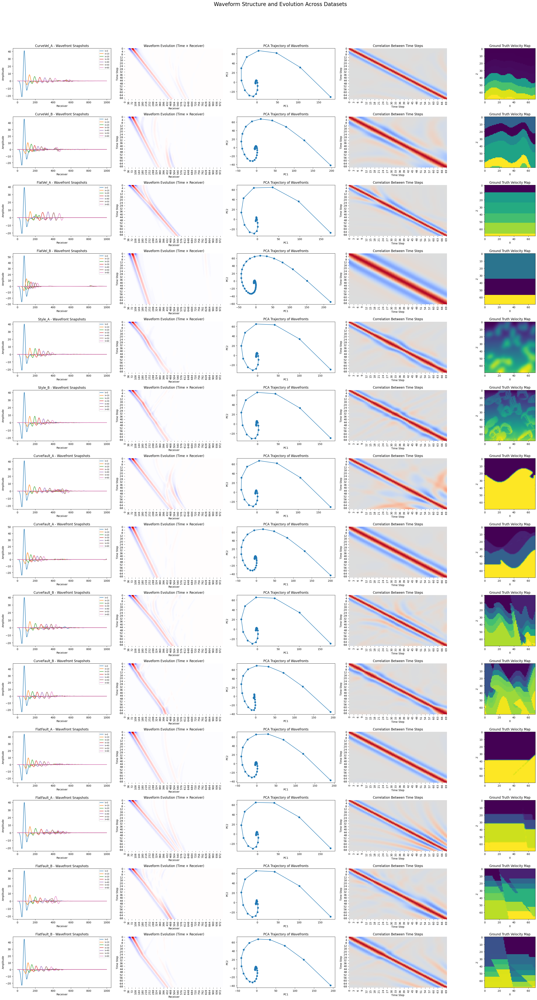

In [ ]:


def combined_waveform_visualization(data_file_list, work_dir, output_path='combined_waveform_analysis.png'):
    n_datasets = len(data_file_list)
    fig, axs = plt.subplots(n_datasets, 5, figsize=(30, 4 * n_datasets))
    fig.suptitle("Waveform Structure and Evolution Across Datasets", fontsize=20)

    for idx, (dataset_name, x_file, y_file, complexity) in enumerate(data_file_list):
        try:
            print(f"Processing {dataset_name}")
            x_path = os.path.join(work_dir, dataset_name, x_file)
            y_path = os.path.join(work_dir, dataset_name, y_file)
            X = np.load(x_path, mmap_mode='r')
            y = np.load(y_path, mmap_mode='r')

            waveform = X[0, 0, :, :].T  # (70 time steps, 1000 receivers)

            # Panel 1: wavefront snapshots at selected time steps
            selected_ts = [0, 10, 20, 30, 40, 50, 60]
            for t in selected_ts:
                axs[idx, 0].plot(waveform[t], label=f"t={t}")
            axs[idx, 0].set_title(f"{dataset_name} - Wavefront Snapshots")
            axs[idx, 0].set_xlabel("Receiver")
            axs[idx, 0].set_ylabel("Amplitude")
            axs[idx, 0].legend(fontsize='x-small')

            # Panel 2: Heatmap of waveform evolution
            sns.heatmap(waveform, cmap='seismic', center=0, ax=axs[idx, 1], cbar=False)
            axs[idx, 1].set_title("Waveform Evolution (Time × Receiver)")
            axs[idx, 1].set_xlabel("Receiver")
            axs[idx, 1].set_ylabel("Time Step")

            # Panel 3: PCA of time step embeddings
            pca = PCA(n_components=2)
            time_embeddings = pca.fit_transform(waveform)
            axs[idx, 2].plot(time_embeddings[:, 0], time_embeddings[:, 1], marker='o')
            axs[idx, 2].set_title("PCA Trajectory of Wavefronts")
            axs[idx, 2].set_xlabel("PC1")
            axs[idx, 2].set_ylabel("PC2")

            # Panel 4: Correlation matrix of time steps
            corr_matrix = np.corrcoef(waveform)
            sns.heatmap(corr_matrix, cmap='coolwarm', center=0, ax=axs[idx, 3], cbar=False)
            axs[idx, 3].set_title("Correlation Between Time Steps")
            axs[idx, 3].set_xlabel("Time Step")
            axs[idx, 3].set_ylabel("Time Step")

            velocity_map = y[0, 0]  # (70, 70)
            axs[idx, 4].imshow(velocity_map, cmap='viridis')
            axs[idx, 4].set_title("Ground Truth Velocity Map")
            axs[idx, 4].set_xlabel("X")
            axs[idx, 4].set_ylabel("Z")


        except Exception as e:
            print(f"Error processing {dataset_name}: {e}")
            for j in range(4):
                axs[idx, j].axis('off')
                axs[idx, 0].text(0.5, 0.5, f"Error loading {dataset_name}:\n{e}", ha='center', va='center', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    fig.savefig(output_path, dpi=150)
    print(f"Combined waveform image saved to: {output_path}")

combined_waveform_visualization(data_file_list, work_dir, output_path='combined_waveform_analysis.png')

# Analysis

**Wavefront Snapshots at Key Time Steps** - Each line represents the amplitude recorded at 1000 receivers at a specific time (e.g., t = 0, 10, ..., 60).

* The wavefront is smooth and balanced across all datasets.
* As time increases, the signal moves outward and dissipates.
* Strong initial peaks gradually weaken and spread — indicating energy loss and dispersion, which is expected.


**Heatmap of Waveform Evolution (Time x Receiver)**
* Diagonal bands: this looks to be wave propagation over time
* There's temporal structure across time steps
* There's a propagation pattern to capture

**PCA Trajectory of Wavefronts** - Each dot represents the projection of a time step's wavefront (1000D) into a 2D PCA space.
* Most datasets show a **smooth, spiral or arc-like progression** — which means wavefronts **evolve smoothly over time**
* This low-dimensional structure implies that **wavefronts lie on a manifold**

**Correlation Matrix Between Time Steps**
* Strong correlation between **neighboring time steps**
* A clear **banded structure** around the diagonal
* There is **temporal redundancy** (good for learning)
* But also **non-trivial variation** across time — so modeling time step interactions is necessary


In [ ]:
import pandas as pd

def compute_waveform_velocity_summary(data_file_list, work_dir):
    summary_rows = []

    for dataset_name, x_file, y_file, complexity in data_file_list:
        try:
            print(f"Analyzing {dataset_name}...")

            x_path = os.path.join(work_dir, dataset_name, x_file)
            y_path = os.path.join(work_dir, dataset_name, y_file)
            X = np.load(x_path, mmap_mode='r')
            y = np.load(y_path, mmap_mode='r')

            waveform = X[0, 0, :, :].T  # (70 time steps, 1000 receivers)
            velocity_map = y[0, 0]     # (70, 70)

            #1. Velocity statistics
            vel_mean = np.mean(velocity_map)
            vel_std = np.std(velocity_map)

            #2. Total Variation
            dx = np.abs(np.diff(velocity_map, axis=1))
            dz = np.abs(np.diff(velocity_map, axis=0))
            total_variation = np.mean(dx) + np.mean(dz)

            #3. Estimate number of layers
            grad_z = np.abs(np.diff(velocity_map, axis=0))
            layer_changes = (grad_z > 50).sum(axis=0)
            avg_layers = int(np.mean(layer_changes)) + 1

            #4. Waveform PCA Arc Length
            from sklearn.decomposition import PCA
            pca = PCA(n_components=2)
            time_embeddings = pca.fit_transform(waveform)
            arc_length = np.sum(np.linalg.norm(np.diff(time_embeddings, axis=0), axis=1))

            # 5. Correlation Entropy
            corr = np.corrcoef(waveform)
            corr_flat = np.abs(corr[np.triu_indices_from(corr, k=1)])
            hist, _ = np.histogram(corr_flat, bins=50, density=True)
            entropy = -np.sum(hist * np.log(hist + 1e-9))

            # 6. Store results
            summary_rows.append({
                "Dataset": dataset_name,
                "Complexity": complexity,
                "Mean Velocity": round(vel_mean, 2),
                "Std Velocity": round(vel_std, 2),
                "Total Variation": round(total_variation, 2),
                "# Estimated Layers": avg_layers,
                "Wavefront PCA Arc Length": round(arc_length, 2),
                "Correlation Entropy": round(entropy, 2)
            })

        except Exception as e:
            print(f"Error processing {dataset_name}: {e}")
            summary_rows.append({
                "Dataset": dataset_name,
                "Complexity": complexity,
                "Error": str(e)
            })

    return pd.DataFrame(summary_rows)


summary_df = compute_waveform_velocity_summary(data_file_list, work_dir)
display(summary_df)



Analyzing CurveVel_A...
Analyzing CurveVel_B...
Analyzing FlatVel_A...
Analyzing FlatVel_B...
Analyzing Style_A...
Analyzing Style_B...
Analyzing CurveFault_A...
Analyzing CurveFault_A...
Analyzing CurveFault_B...
Analyzing CurveFault_B...
Analyzing FlatFault_A...
Analyzing FlatFault_A...
Analyzing FlatFault_B...
Analyzing FlatFault_B...


,Dataset,Complexity,Mean Velocity,Std Velocity,Total Variation,# Estimated Layers,Wavefront PCA Arc Length,Correlation Entropy
0,CurveVel_A,easy,2524.330078,879.030029,45.110001,4,385.660004,-113.44
1,CurveVel_B,easy,2971.429932,740.260010,83.879997,5,418.480011,-53.53
2,FlatVel_A,easy,3059.760010,699.309998,37.160000,6,377.989990,-102.14
3,FlatVel_B,easy,4084.800049,110.040001,6.460000,3,442.769989,-54.04
4,Style_A,easy,2759.620117,588.109985,91.940002,29,387.609985,-79.10
5,Style_B,easy,2842.120117,593.539978,133.000000,26,396.059998,-79.68
6,CurveFault_A,medium,2883.989990,793.159973,43.110001,4,390.839996,-62.80
7,CurveFault_A,medium,3410.449951,658.229980,38.279999,7,416.670013,-79.04
8,CurveFault_B,medium,2957.000000,957.760010,101.580002,6,385.390015,-72.85
9,CurveFault_B,medium,3262.540039,815.440002,90.849998,6,411.369995,-88.70


### **Temporal Nature of Seismic Waveforms**

The input to our model consists of seismic waveform recordings:

$$
\text{(shots, receivers, time steps)} \quad \Rightarrow \quad (5, 1000, 70)
$$

Each receiver records a **time series of amplitude values**, capturing the response to a seismic source. In this 2D representation:

* **Rows (receivers)** correspond to spatial locations across the array.
* **Columns (time steps)** represent how a wavefront evolves over time.

Our exploratory data analysis supports this temporal interpretation:

* **Correlation matrices** show strong diagonals, indicating that adjacent time steps are highly correlated — a hallmark of smooth temporal evolution.
* **PCA trajectories** of time-step embeddings form smooth curves.

#### Reference Literature

* **Seismic waveforms are inherently time series**: they measure ground motion at fixed locations over time, and temporal resolution is critical for subsurface imaging ([Google Sites](https://sites.google.com/msu.edu/wei-seismic-training/seismic-time-series-data)).
* **Transformers for seismic data**: Recent work has shown that attention-based models outperform classical approaches by capturing global temporal patterns in waveform inversion tasks ([Nature, 2024](https://www.nature.com/articles/s43247-024-01243-8)).

#### **Velocity Map Insights**

* `FlatVel_A` and `FlatFault_A` feature simple, horizontally layered structures; relatively uniform geological conditions.
* `CurveVel`, `CurveFault`, and `Style` display nonlinear layering, faulting, and irregular textures, representing more complex and geologically diverse subsurface models.

#### **Waveform-Derived Evidence**

Although amplitude distributions are statistically consistent across datasets (similar means and standard deviations), waveform-derived metrics highlight substantial differences in structural complexity:

* **PCA Trajectories**: Flat datasets produce smooth, coherent paths, suggesting regular, low-dimensional wavefront evolution. Conversely, Style and CurveFault datasets show irregular, dispersed PCA curves, reflecting complex energy interactions.
* **Correlation Entropy**: Flat datasets exhibit strong temporal coherence (low entropy), while more complex datasets demonstrate higher entropy, indicating less predictable and more chaotic wavefront behavior.


### **Physics-Informed Loss Functions Improve Realism**

Physics-informed loss functions, such as **total variation (TV) regularization**, **gradient smoothness penalties**, and **PDE-based residual constraints**, play a role in guiding deep learning models toward physically plausible velocity maps (Ding, Y. 2024). These losses promote smooth, piecewise-continuous outputs and help reduce non-physical artifacts during training.

#### **Observations**

* Our EDA confirms that applying smoothing losses can be highly beneficial for simple, layered datasets such as `FlatVel` and `FlatFault`, where the underlying geology is well-aligned with piecewise-smooth assumptions.


## **Data Preparation**

Before training our deep learning models, we preprocess the seismic waveform data to extract structured representations that capture the underlying temporal and spatial dependencies.

### **Input Format**

Each input sample is a seismic recording represented as a tensor of shape:

$$
(5 \, \text{shots}, 1000 \, \text{receivers}, 70 \, \text{time steps})
$$

This means that for every sample:

* We have 5 independent seismic shots.
* Each shot is recorded across 1000 spatially distributed receivers.
* Each receiver logs amplitude values across 70 time steps.

To simplify model design and reduce computational overhead, we focus on the **first shot** from each sample and reshape the waveform into a 2D matrix of shape:

$$
(70 \, \text{time steps}, 1000 \, \text{receivers})
$$

In this configuration:

* Each **row** represents a single time step (a wavefront snapshot across space).
* Each **row vector** is treated as a high-dimensional token — similar to a word embedding in NLP.

### **Temporal Embedding Construction**

Rather than feeding raw amplitude values directly into the model, we construct embeddings to enable the model to capture higher-level abstractions of the wavefront. Our approach is inspired by positional and token embeddings used in Transformer models.

#### 1. **Linear Projection**

Each 1000-dimensional time-step vector is passed through a linear layer (learnable matrix) to project it into a fixed-size embedding space:

$$
\text{Embedding dimension: } d_{model} = 128
$$

This projection helps the model:

* Learn feature-rich representations of wavefront shapes.
* Reduce the input dimensionality for computational efficiency.

#### 2. **Positional Encoding**

To preserve the temporal order of wavefronts, we add **positional encodings** to each time-step embedding. These encodings are either:

* **Sinusoidal** (fixed) functions of the time index, or
* **Learned** embeddings trained alongside the model.

This ensures that the model can distinguish between early vs. late time steps, which is essential for capturing causal wavefront evolution.

#### 3. **Batch Preparation**

We prepare batches of samples with shape:

$$
(B, T, d_{model}) \quad \text{where } B = \text{batch size}, T = 70
$$

These are passed into a Transformer encoder or other temporal model.

## Learing Path
Given the complexity of the data from our EDA we want to take a phased approach to learning:
1. Step 1: Train on `FlatVel_A`,`FlatFault_A` - learn smooth layering, basic propagation
2. Step 2: Train on `CurveVel_A/B`, `FlatFel_B`
3. Step 3: Include curriculum learning to train on all levels of complexity for our model.

# Step 1: First Shot Training
To reduce the complexity of the training we will start with a single shot and attempt to find the right loss functions and makeup of model to use.


In [4]:
def load_phase_data(data_file_list, work_dir):
    X_all, y_all = [], []
    for dataset_name, x_file, y_file, _ in data_file_list:
        x_path = os.path.join(work_dir, dataset_name, x_file)
        y_path = os.path.join(work_dir, dataset_name, y_file)
        X = np.load(x_path, mmap_mode='r')
        y = np.load(y_path, mmap_mode='r')
        X_all.append(X)
        y_all.append(y)
    X_all = np.concatenate(X_all, axis=0)
    y_all = np.concatenate(y_all, axis=0)
    return X_all, y_all

In [ ]:
phase1_data_file_list = [
    ['FlatVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
    ['FlatFault_A', 'seis2_1_0.npy', 'vel2_1_0.npy', 'medium'],
    ['FlatFault_A', 'seis4_1_0.npy', 'vel4_1_0.npy', 'medium']
]



X_phase1, y_phase1 = load_phase_data(phase1_data_file_list, work_dir)
print("Phase 1 input shape:", X_phase1.shape)
print("Phase 1 output shape:", y_phase1.shape)


Phase 1 input shape: (1500, 5, 1000, 70)
Phase 1 output shape: (1500, 1, 70, 70)


### **Normalize the Data**

We perform sample-wise normalization — meaning we normalize each waveform sample independently. Specifically, for each `(time, receiver)` matrix (shape `(70, 1000)` per sample):

$$
X_{\text{norm}} = \frac{X - \mu}{\sigma + \epsilon}
$$

Where:

* $\mu$ is the **mean amplitude** of the waveform sample
* $\sigma$ is the **standard deviation**
* $\epsilon$ is a small constant to prevent division by zero (e.g., $1e{-8}$)


In [ ]:
# Use only the first shot for simplicity
X_phase1_trimmed = X_phase1[:, 0, :, :].transpose(0, 2, 1)  # Shape: (batch, time, receivers)

# Normalize amplitudes (mean 0, std 1 per sample)
X_phase1_norm = (X_phase1_trimmed - X_phase1_trimmed.mean(axis=(1, 2), keepdims=True)) / \
                (X_phase1_trimmed.std(axis=(1, 2), keepdims=True) + 1e-8)

# Confirm shapes
print("Final input shape:", X_phase1_norm.shape)  # (samples, 70 time steps, 1000 receivers)
print("Velocity map shape:", y_phase1.shape)      # (samples, 1, 70, 70)


Final input shape: (1500, 70, 1000)
Velocity map shape: (1500, 1, 70, 70)


# Step 1: Model Building

* Each input sample is a waveform represented as a **(time steps × receivers)** matrix — e.g., `(70, 1000)`
* After linear projection, this becomes:

  $$
  \text{Input shape: } (T = 70, \, d_{\text{model}} = 128)
  $$
* Each time step now corresponds to a **wavefront snapshot**, embedded in a learnable vector space

Based on EDA:

* PCA and correlation matrices show that each time step carries evolving, structured information.
* In complex datasets (like `Style_B`), different time steps carry different spatial patterns, possibly due to reflections or scattering.

Our loss function is one of the most critical components of this task, especially given the physical nature of the output (velocity maps) and the insights from your EDA.


## **Loss Components**

### 1. **Reconstruction Loss (MSE or MAE)**

* Measures the **pixel-wise error** between predicted and true velocity maps.
* MSE (Mean Squared Error) emphasizes large errors.
* MAE (Mean Absolute Error) is more robust to outliers (e.g., abrupt transitions in faults).


### 2. **Total Variation (TV) Loss**

Encourages **piecewise-smooth** velocity maps by penalizing abrupt local changes:

$$
\mathscr{L}_{TV} = \sum |\nabla_x v| + |\nabla_z v|
$$

* Helps regularize the output
* Reduces noise or checkerboard artifacts
* Encourages **layered structure** in simple maps

### 3. **Gradient Loss (Edge Preservation)**

Promotes alignment of spatial gradients between prediction and ground truth. This is useful for:

* Preserving **sharp geological boundaries**
* Encouraging correct **layer thickness and placement**


In [5]:
def total_variation_loss(y_pred):
    dx = tf.abs(y_pred[:, :, 1:, :] - y_pred[:, :, :-1, :])
    dy = tf.abs(y_pred[:, 1:, :, :] - y_pred[:, :-1, :, :])
    return tf.reduce_mean(dx) + tf.reduce_mean(dy)


def gradient_loss(y_true, y_pred):
    # y_true, y_pred: (B, 70, 70, 1)
    pred_dx = y_pred[:, :, 1:, :] - y_pred[:, :, :-1, :]
    pred_dy = y_pred[:, 1:, :, :] - y_pred[:, :-1, :, :]
    true_dx = y_true[:, :, 1:, :] - y_true[:, :, :-1, :]
    true_dy = y_true[:, 1:, :, :] - y_true[:, :-1, :, :]

    loss_dx = tf.reduce_mean(tf.abs(pred_dx - true_dx))
    loss_dy = tf.reduce_mean(tf.abs(pred_dy - true_dy))
    return loss_dx + loss_dy

def reconstruction_loss(y_true, y_pred):
    return tf.reduce_mean(tf.square(y_true - y_pred))

def composite_loss(lambda_tv=0.1, lambda_grad=0.1):
    def loss(y_true, y_pred):
        recon = reconstruction_loss(y_true, y_pred)
        tv = total_variation_loss(y_pred)
        grad = gradient_loss(y_true, y_pred)
        return recon + lambda_tv * tv + lambda_grad * grad
    return loss

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Temporal embedding with positional encoding
class TemporalEmbedding(tf.keras.layers.Layer):
    def __init__(self, input_dim, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.proj = layers.Dense(embed_dim)
        self.pos_encoding = None

    def build(self, input_shape):
        self.pos_encoding = self.add_weight(
            name="pos_encoding",
            shape=(1, input_shape[1], self.embed_dim),
            initializer=tf.keras.initializers.RandomNormal(stddev=0.1),
            trainable=True
        )

    def call(self, x):
        x = self.proj(x)
        return x + self.pos_encoding

def transformer_encoder_block(embed_dim, num_heads, ff_dim, dropout=0.1):
    inputs = layers.Input(shape=(70, embed_dim))
    attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(inputs, inputs)
    attention = layers.Dropout(dropout)(attention)
    out1 = layers.LayerNormalization(epsilon=1e-6)(inputs + attention)

    ffn = layers.Dense(ff_dim, activation="relu")(out1)
    ffn = layers.Dense(embed_dim)(ffn)
    ffn = layers.Dropout(dropout)(ffn)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn)
    return models.Model(inputs, out2, name="transformer_block")

# CNN decoder to produce the 70×70 velocity map
def cnn_decoder(input_shape):
    inputs = layers.Input(shape=input_shape)
    x = layers.Reshape((10, 7, input_shape[-1]))(inputs)
    x = layers.Conv2DTranspose(64, 3, strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2DTranspose(32, 3, strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2D(1, 3, padding="same")(x)
    x = layers.Resizing(70, 70)(x)
    return models.Model(inputs, x, name="cnn_decoder")

# Assembling the full model
def build_waveform_to_velocity_model(input_shape=(70, 1000), embed_dim=128, num_heads=4, ff_dim=256):
    inputs = layers.Input(shape=input_shape)
    x = TemporalEmbedding(input_dim=input_shape[1], embed_dim=embed_dim)(inputs)
    x = transformer_encoder_block(embed_dim, num_heads, ff_dim)(x)
    x = cnn_decoder(x.shape[1:])(x)
    return models.Model(inputs, x, name="Waveform2VelocityNet")

# Build and show summary
model = build_waveform_to_velocity_model()
model.summary()


Model: "Waveform2VelocityNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 70, 1000)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ temporal_embedding                   │ (None, 70, 128)             │         137,088 │
│ (TemporalEmbedding)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer_block (Functional)       │ (None, 70, 128)             │         330,240 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cnn_decoder (Functional)             │ (None, 70, 70, 1)           │          92,545 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 559,873 (2.14 MB)

 Trainable params: 559,873 (2.14 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(
    optimizer='adam',
    loss=composite_loss(lambda_tv=0.1, lambda_grad=0.1),
    metrics=[reconstruction_loss]
)


In [ ]:
# Split into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_phase1_norm, y_phase1, test_size=0.2, random_state=42)

y_train = np.transpose(y_train, (0, 2, 3, 1))
y_val = np.transpose(y_val, (0, 2, 3, 1))
# Convert to tf.data.Dataset
BATCH_SIZE = 16

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [6]:
EPOCHS = 50

from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    verbose=1,
    min_lr=1e-6
)

early_stop = EarlyStopping(
    patience=8,
    restore_best_weights=True,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath="best_velocity_model.h5",
    save_best_only=True,
    monitor="val_loss",
    verbose=1
)

In [ ]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    verbose=1,
    min_lr=1e-6
)

early_stop = EarlyStopping(
    patience=8,
    restore_best_weights=True,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath="best_velocity_model.h5",
    save_best_only=True,
    monitor="val_loss",
    verbose=1
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=[reduce_lr, early_stop, checkpoint]
)

Epoch 1/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8353901.5000 - reconstruction_loss: 8353890.0000
Epoch 1: val_loss improved from inf to 1039347.62500, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - loss: 8220401.5000 - reconstruction_loss: 8220388.5000 - val_loss: 1039347.6250 - val_reconstruction_loss: 1038916.4375 - learning_rate: 0.0010
Epoch 2/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 981017.8125 - reconstruction_loss: 980925.8750
Epoch 2: val_loss improved from 1039347.62500 to 780531.12500, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 977892.5625 - reconstruction_loss: 977801.0625 - val_loss: 780531.1250 - val_reconstruction_loss: 780213.2500 - learning_rate: 0.0010
Epoch 3/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 777058.0625 - reconstruction_loss: 776997.1875
Epoch 3: val_loss improved from 780531.12500 to 623087.93750, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 776421.2500 - reconstruction_loss: 776360.4375 - val_loss: 623087.9375 - val_reconstruction_loss: 622752.8125 - learning_rate: 0.0010
Epoch 4/100
69/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 592852.9375 - reconstruction_loss: 592811.8750
Epoch 4: val_loss improved from 623087.93750 to 487606.87500, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 589269.8125 - reconstruction_loss: 589229.0625 - val_loss: 487606.8750 - val_reconstruction_loss: 487707.5938 - learning_rate: 0.0010
Epoch 5/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 476553.8750 - reconstruction_loss: 476521.1875
Epoch 5: val_loss improved from 487606.87500 to 411276.37500, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 476044.0000 - reconstruction_loss: 476011.3125 - val_loss: 411276.3750 - val_reconstruction_loss: 410222.7812 - learning_rate: 0.0010
Epoch 6/100
74/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 422789.9375 - reconstruction_loss: 422757.7188
Epoch 6: val_loss improved from 411276.37500 to 398804.87500, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 422544.7188 - reconstruction_loss: 422512.5312 - val_loss: 398804.8750 - val_reconstruction_loss: 397744.9062 - learning_rate: 0.0010
Epoch 7/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 394438.1562 - reconstruction_loss: 394408.0938
Epoch 7: val_loss improved from 398804.87500 to 359476.87500, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 394561.0938 - reconstruction_loss: 394531.0625 - val_loss: 359476.8750 - val_reconstruction_loss: 358309.9688 - learning_rate: 0.0010
Epoch 8/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 365759.0938 - reconstruction_loss: 365731.5000
Epoch 8: val_loss improved from 359476.87500 to 299178.34375, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 364901.8438 - reconstruction_loss: 364874.3125 - val_loss: 299178.3438 - val_reconstruction_loss: 298242.1562 - learning_rate: 0.0010
Epoch 9/100
74/75 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 314652.9062 - reconstruction_loss: 314629.1562
Epoch 9: val_loss did not improve from 299178.34375
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 314569.9375 - reconstruction_loss: 314546.1875 - val_loss: 301799.7188 - val_reconstruction_loss: 301139.2188 - learning_rate: 0.0010
Epoch 10/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 319549.3750 - reconstruction_loss: 319527.3125
Epoch 10: val_loss improved from 299178.34375 to 297359.40625, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 319174.6250 - reconstruction_loss: 319152.5938 - val_loss: 297359.4062 - val_reconstruction_loss: 296737.3438 - learning_rate: 0.0010
Epoch 11/100
71/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 301284.1250 - reconstruction_loss: 301263.4375
Epoch 11: val_loss improved from 297359.40625 to 278849.68750, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 301054.4375 - reconstruction_loss: 301033.7812 - val_loss: 278849.6875 - val_reconstruction_loss: 278137.8750 - learning_rate: 0.0010
Epoch 12/100
71/75 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 286891.5000 - reconstruction_loss: 286871.5625
Epoch 12: val_loss improved from 278849.68750 to 268771.93750, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 287069.3125 - reconstruction_loss: 287049.3438 - val_loss: 268771.9375 - val_reconstruction_loss: 268035.7812 - learning_rate: 0.0010
Epoch 13/100
71/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 289717.3438 - reconstruction_loss: 289697.8438
Epoch 13: val_loss did not improve from 268771.93750
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 289666.8125 - reconstruction_loss: 289647.3125 - val_loss: 268807.0000 - val_reconstruction_loss: 268186.7500 - learning_rate: 0.0010
Epoch 14/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 286425.3750 - reconstruction_loss: 286406.5938
Epoch 14: val_loss did not improve from 268771.93750
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 286409.6250 - reconstruction_loss: 286390.8438 - val_loss: 274624.5000 - val_reconstruction_loss: 274088.0625 - learning_rate: 0.0010
Epoch 15/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 282406.6250 - reconstruction_loss: 282388.0000
Epoch 15: ReduceLROnPlateau 

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 266749.8125 - reconstruction_loss: 266731.5625 - val_loss: 256457.9531 - val_reconstruction_loss: 255603.7031 - learning_rate: 5.0000e-04
Epoch 17/100
70/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 260537.0469 - reconstruction_loss: 260519.3594
Epoch 17: val_loss improved from 256457.95312 to 253790.64062, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 260402.9219 - reconstruction_loss: 260385.2188 - val_loss: 253790.6406 - val_reconstruction_loss: 252898.9531 - learning_rate: 5.0000e-04
Epoch 18/100
69/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 260214.4844 - reconstruction_loss: 260196.9375
Epoch 18: val_loss did not improve from 253790.64062
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 260048.5156 - reconstruction_loss: 260030.9688 - val_loss: 265025.1250 - val_reconstruction_loss: 264156.1250 - learning_rate: 5.0000e-04
Epoch 19/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 262401.6875 - reconstruction_loss: 262384.3125
Epoch 19: val_loss did not improve from 253790.64062
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 262003.3438 - reconstruction_loss: 261986.0000 - val_loss: 255995.7344 - val_reconstruction_loss: 255359.4688 - learning_rate: 5.0000e-04
Epoch 20/100
68/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 252401.4219 - reconstruction_loss: 252384.2656
Epoch 20: val_lo

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 252033.1094 - reconstruction_loss: 252015.9531 - val_loss: 253344.1562 - val_reconstruction_loss: 252731.2344 - learning_rate: 5.0000e-04
Epoch 21/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 248070.3281 - reconstruction_loss: 248053.5469
Epoch 21: val_loss improved from 253344.15625 to 252919.25000, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 247977.0938 - reconstruction_loss: 247960.3281 - val_loss: 252919.2500 - val_reconstruction_loss: 252492.5312 - learning_rate: 5.0000e-04
Epoch 22/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 260112.9062 - reconstruction_loss: 260096.2500
Epoch 22: val_loss did not improve from 252919.25000
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 260025.6406 - reconstruction_loss: 260008.9688 - val_loss: 264965.9688 - val_reconstruction_loss: 264256.5000 - learning_rate: 5.0000e-04
Epoch 23/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 257288.8125 - reconstruction_loss: 257272.0625
Epoch 23: val_loss improved from 252919.25000 to 250349.25000, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 256921.4531 - reconstruction_loss: 256904.7031 - val_loss: 250349.2500 - val_reconstruction_loss: 249684.5781 - learning_rate: 5.0000e-04
Epoch 24/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 246766.7500 - reconstruction_loss: 246750.2188
Epoch 24: val_loss did not improve from 250349.25000
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 246563.1250 - reconstruction_loss: 246546.5938 - val_loss: 252386.6719 - val_reconstruction_loss: 251698.6875 - learning_rate: 5.0000e-04
Epoch 25/100
70/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 244720.6719 - reconstruction_loss: 244704.3906
Epoch 25: val_loss improved from 250349.25000 to 247593.96875, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 244512.8438 - reconstruction_loss: 244496.5469 - val_loss: 247593.9688 - val_reconstruction_loss: 247024.4219 - learning_rate: 5.0000e-04
Epoch 26/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 244811.7188 - reconstruction_loss: 244795.4844
Epoch 26: val_loss did not improve from 247593.96875
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 244647.9844 - reconstruction_loss: 244631.7500 - val_loss: 254247.1406 - val_reconstruction_loss: 254003.1562 - learning_rate: 5.0000e-04
Epoch 27/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 239112.1719 - reconstruction_loss: 239096.0000
Epoch 27: val_loss did not improve from 247593.96875
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 239006.1406 - reconstruction_loss: 238989.9688 - val_loss: 252962.9531 - val_reconstruction_loss: 252547.5781 - learning_rate: 5.0000e-04
Epoch 28/100
74/75 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 245693.2812 - reconstruction_loss: 245677.1406
Epoch 28: ReduceL

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 231127.4375 - reconstruction_loss: 231111.5469 - val_loss: 247472.5938 - val_reconstruction_loss: 247292.5781 - learning_rate: 1.2500e-04
Epoch 33/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 228696.0312 - reconstruction_loss: 228680.1094
Epoch 33: val_loss improved from 247472.59375 to 244669.17188, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 228575.9531 - reconstruction_loss: 228560.0156 - val_loss: 244669.1719 - val_reconstruction_loss: 244380.3125 - learning_rate: 1.2500e-04
Epoch 34/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 229266.2656 - reconstruction_loss: 229250.4219
Epoch 34: val_loss did not improve from 244669.17188
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 229119.8125 - reconstruction_loss: 229103.9688 - val_loss: 247381.1406 - val_reconstruction_loss: 247059.8438 - learning_rate: 1.2500e-04
Epoch 35/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 225803.0781 - reconstruction_loss: 225787.2344
Epoch 35: val_loss improved from 244669.17188 to 244193.35938, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 225768.4062 - reconstruction_loss: 225752.5625 - val_loss: 244193.3594 - val_reconstruction_loss: 243889.1094 - learning_rate: 1.2500e-04
Epoch 36/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 223764.4219 - reconstruction_loss: 223748.5312
Epoch 36: val_loss improved from 244193.35938 to 243406.68750, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 223713.6875 - reconstruction_loss: 223697.7969 - val_loss: 243406.6875 - val_reconstruction_loss: 243069.7969 - learning_rate: 1.2500e-04
Epoch 37/100
70/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 223557.7188 - reconstruction_loss: 223541.9062
Epoch 37: val_loss improved from 243406.68750 to 235760.90625, saving model to best_velocity_model.h5


75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 223489.6406 - reconstruction_loss: 223473.8438 - val_loss: 235760.9062 - val_reconstruction_loss: 235471.4219 - learning_rate: 1.2500e-04
Epoch 38/100
72/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 222316.1250 - reconstruction_loss: 222300.2656
Epoch 38: val_loss did not improve from 235760.90625
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 222201.3438 - reconstruction_loss: 222185.5000 - val_loss: 237493.9219 - val_reconstruction_loss: 237174.7656 - learning_rate: 1.2500e-04
Epoch 39/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 221072.4688 - reconstruction_loss: 221056.7188
Epoch 39: val_loss did not improve from 235760.90625
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 220997.5781 - reconstruction_loss: 220981.8281 - val_loss: 238726.7188 - val_reconstruction_loss: 238386.9219 - learning_rate: 1.2500e-04
Epoch 40/100
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 220851.7344 - reconstruction_loss: 220836.0312
Epoch 40: ReduceLR

In [7]:
def plot_history(history):
  plt.plot(history.history['loss'], label='Train Loss')
  plt.plot(history.history['val_loss'], label='Val Loss')
  plt.title("Training Loss Over Epochs")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.legend()
  plt.grid(True)
  plt.show()


In [8]:
def show_model_prediction(model, X_sample, y_true_sample, idx=0):
    """
    Visualize prediction vs. ground truth for a single sample
    """
    # Expand dimension for batch (1, 70, 1000)
    x_input = np.expand_dims(X_sample[idx], axis=0)

    # Model prediction
    y_pred = model.predict(x_input, verbose=0)[0, :, :, 0]
    y_true = y_true_sample[idx, :, :, 0]

    # Mean Squared Error
    mse = np.mean((y_pred - y_true) ** 2)

    # Plot
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(y_true, cmap='viridis')
    plt.title("Ground Truth Velocity")
    plt.colorbar()

    plt.subplot(1, 3, 2)
    plt.imshow(y_pred, cmap='viridis')
    plt.title("Predicted Velocity")
    plt.colorbar()

    plt.subplot(1, 3, 3)
    plt.imshow(np.abs(y_pred - y_true), cmap='hot')
    plt.title(f"Absolute Error\nMSE: {mse:.2f}")
    plt.colorbar()

    plt.suptitle("Model Prediction vs Ground Truth", fontsize=14)
    plt.tight_layout()
    plt.show()

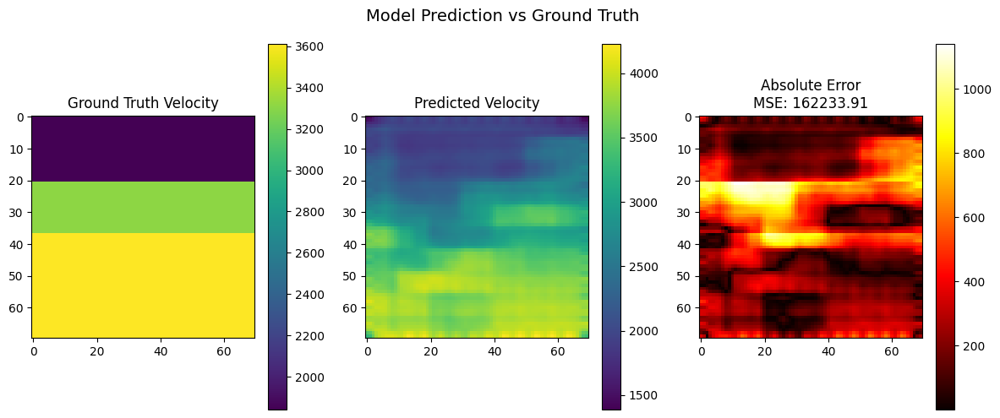

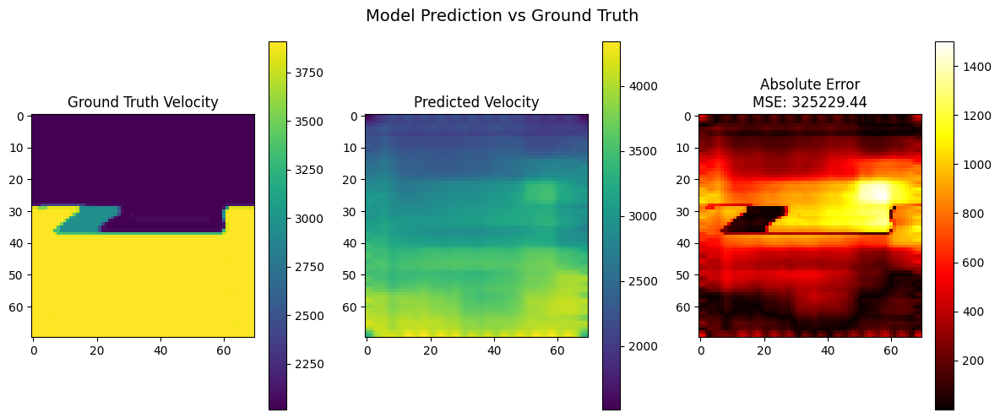

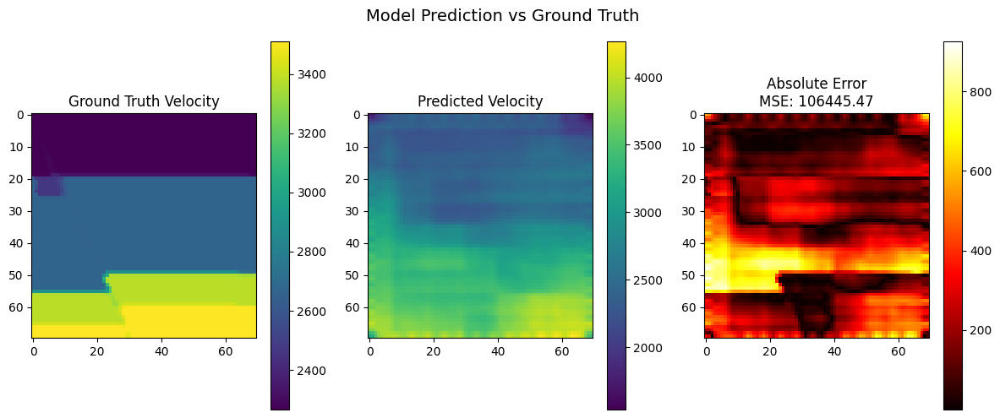

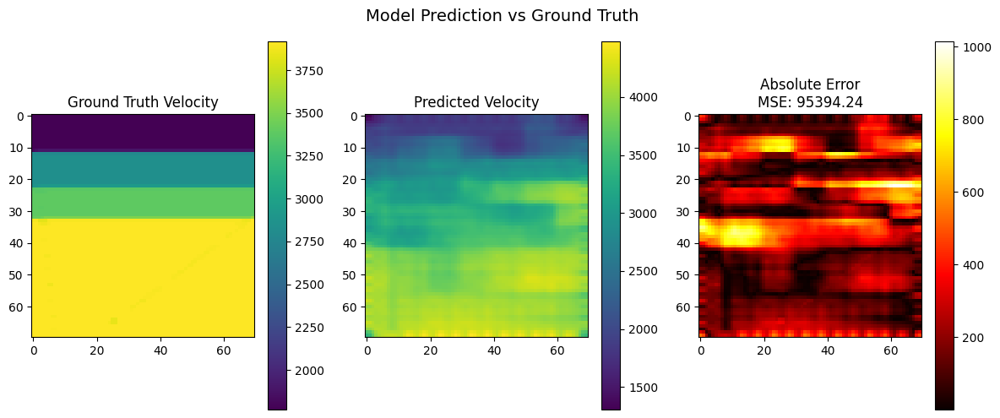

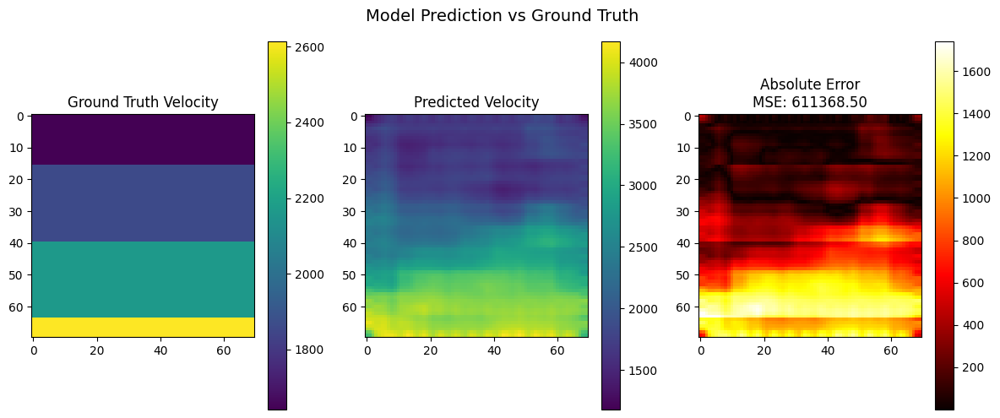

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

for i in range(5):
    show_model_prediction(model, X_train, y_train, idx=i)

# Step 2: Build Complex Models

Taking our step 1 model and adding some complexity to it.  In this section, we implement a hybrid neural architecture designd to learn mapping from the waveform to the velocity maps.  The model combines a temporal transformer encoder with a residual convolutional decoder.  

Objective of this model is to attempt to find the right complexity of our model and see how well we able to generalize on simpler data.

In [9]:
class TemporalEmbedding(tf.keras.layers.Layer):
    def __init__(self, input_dim, embed_dim):
        super().__init__()
        self.embed_dim = embed_dim
        self.proj = layers.Dense(embed_dim)

    def build(self, input_shape):
        self.pos_encoding = self.add_weight(
            shape=(1, input_shape[1], self.embed_dim),
            initializer='random_normal',
            trainable=True,
            name="pos_encoding"
        )

    def call(self, x):
        return self.proj(x) + self.pos_encoding

# Multi-head Transformer Encoder Layer
def transformer_encoder(embed_dim, num_heads=4, ff_dim=512, dropout=0.1):
    inputs = layers.Input(shape=(None, embed_dim))
    x = layers.LayerNormalization()(inputs)
    attn = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(x, x)
    x = layers.Add()([x, attn])
    x = layers.LayerNormalization()(x)
    ffn = layers.Dense(ff_dim, activation='gelu')(x)
    ffn = layers.Dense(embed_dim)(ffn)
    x = layers.Add()([x, ffn])
    return models.Model(inputs, x)

# Deeper Decoder with Residual Blocks and Upsampling
def deep_decoder(input_shape):
    inputs = layers.Input(shape=input_shape)  # e.g., (70, 256)
    x = layers.Reshape((10, 7, input_shape[-1]))(inputs)

    # Residual Block
    def residual_block(x, filters):
      skip = x
      x = layers.Conv2D(filters, 3, padding="same", activation='relu')(x)
      x = layers.Conv2D(filters, 3, padding="same")(x)

      # Match channels if needed
      if skip.shape[-1] != filters:
          skip = layers.Conv2D(filters, 1, padding="same")(skip)

      return layers.ReLU()(x + skip)


    # Upsample path
    x = layers.Conv2D(128, 3, padding="same", activation='relu')(x)
    x = layers.UpSampling2D()(x)  # 20x14
    x = residual_block(x, 128)
    x = layers.UpSampling2D()(x)  # 40x28
    x = residual_block(x, 64)
    x = layers.UpSampling2D()(x)  # 80x56
    x = residual_block(x, 32)
    x = layers.Conv2D(1, 3, padding="same")(x)
    x = layers.Resizing(70, 70)(x)

    return models.Model(inputs, x)

# Full Model Builder
def build_complex_model(input_shape=(70, 1000), embed_dim=256, num_blocks=3):
    inputs = layers.Input(shape=input_shape)
    x = TemporalEmbedding(input_dim=input_shape[1], embed_dim=embed_dim)(inputs)

    for _ in range(num_blocks):
        x = transformer_encoder(embed_dim=embed_dim)(x)

    decoded = deep_decoder(x.shape[1:])(x)
    return models.Model(inputs, decoded, name="ComplexWaveform2Velocity")


In [ ]:
complex_model = build_complex_model()
complex_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=composite_loss(lambda_tv=0.1, lambda_grad=0.1),
    metrics=[reconstruction_loss]
)
complex_model.summary()

Model: "ComplexWaveform2Velocity"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)     │ (None, 70, 1000)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ temporal_embedding_4            │ (None, 70, 256)        │       274,176 │
│ (TemporalEmbedding)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_7 (Functional)       │ (None, 70, 256)        │     1,315,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_8 (Functional)       │ (None, 70, 256)        │     1,315,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_9 (Functional)       │ (None, 70, 256)        │     1,315,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_10 (Functional)      │ (None, 70, 70, 1)      │       739,265 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,960,961 (18.92 MB)

 Trainable params: 4,960,961 (18.92 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    EarlyStopping(patience=8, restore_best_weights=True, verbose=1),
    ModelCheckpoint("best_complex_model.keras", save_best_only=True, monitor="val_loss", verbose=1)
]

history = complex_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=callbacks
)


Epoch 1/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 6450058.0000 - reconstruction_loss: 6450045.0000
Epoch 1: val_loss improved from inf to 1208421.25000, saving model to best_complex_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 6414122.0000 - reconstruction_loss: 6414109.0000 - val_loss: 1208421.2500 - val_reconstruction_loss: 1206810.5000 - learning_rate: 1.0000e-04
Epoch 2/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 988624.6250 - reconstruction_loss: 988598.2500
Epoch 2: val_loss improved from 1208421.25000 to 405874.21875, saving model to best_complex_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 985532.5000 - reconstruction_loss: 985506.1250 - val_loss: 405874.2188 - val_reconstruction_loss: 405205.0938 - learning_rate: 1.0000e-04
Epoch 3/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 379029.1250 - reconstruction_loss: 379006.9062
Epoch 3: val_loss improved from 405874.21875 to 291710.87500, saving model to best_complex_model.ker

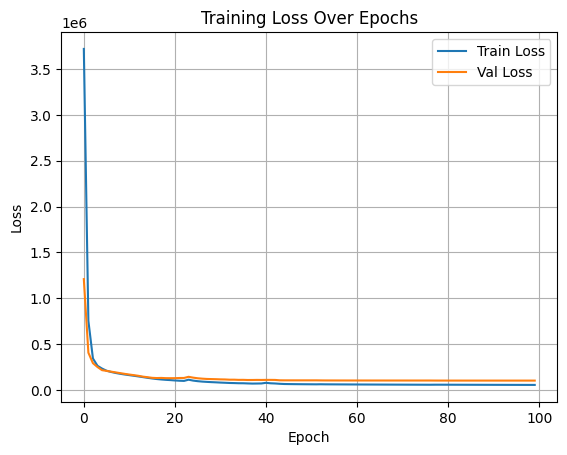

In [ ]:
plot_history(history)

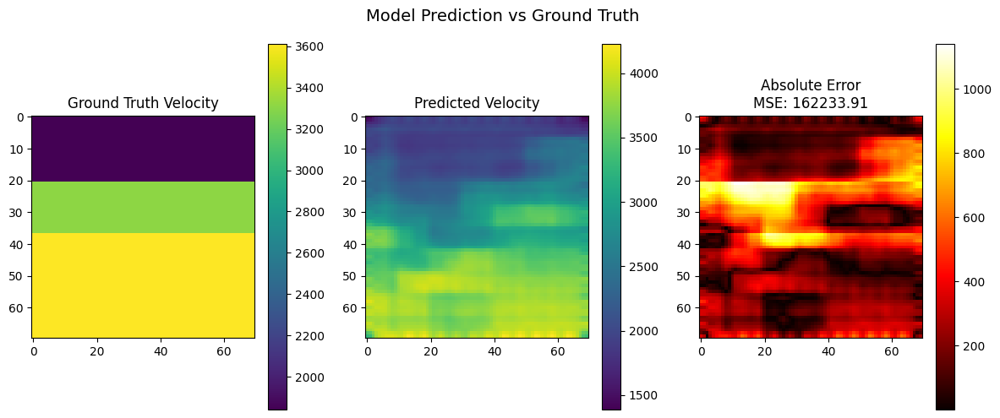

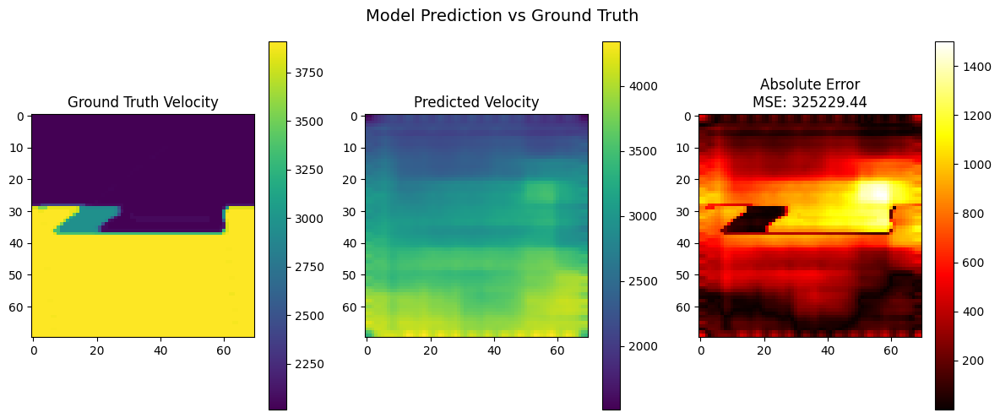

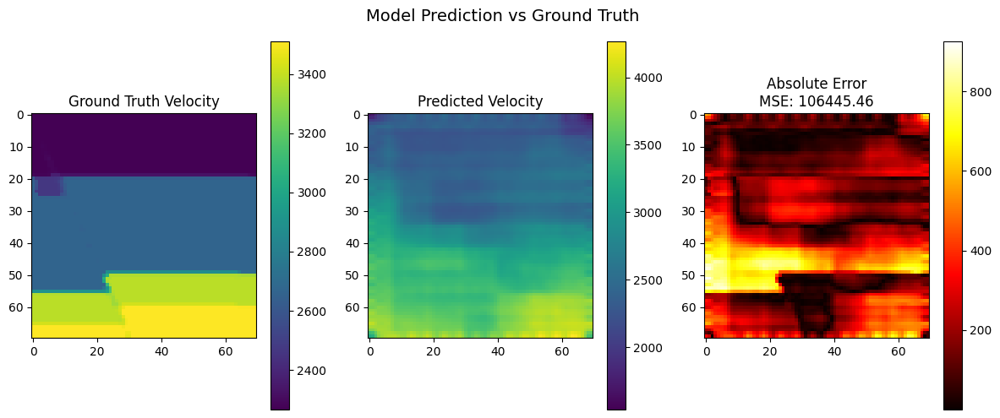

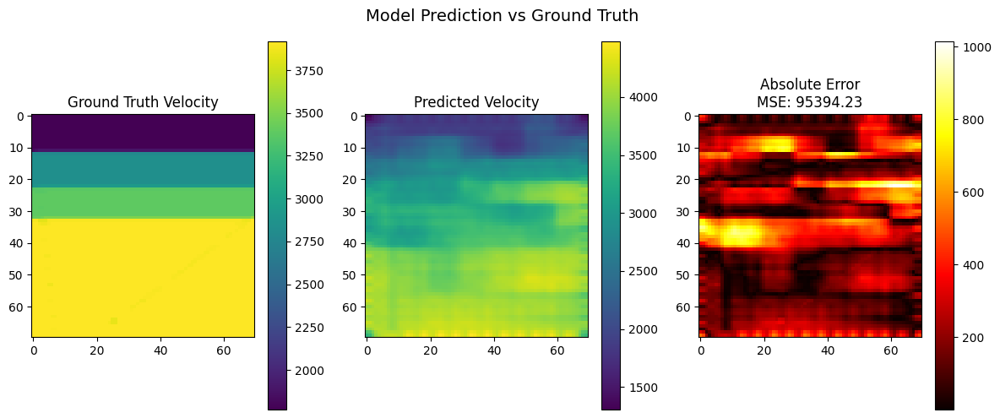

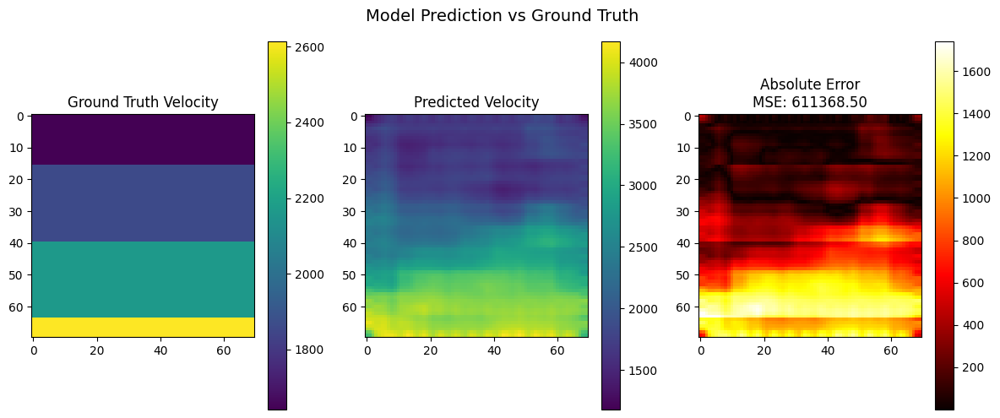

In [ ]:
for i in range(5):
    show_model_prediction(model, X_train, y_train, idx=i)

Looking at the findings from this model, we now want to take all five shots and add complexity to our model.

In [ ]:
X_phase1_all_shots = np.transpose(X_phase1, (0, 3, 2, 1))

X_phase1_all_shots = (X_phase1_all_shots - X_phase1_all_shots.mean(axis=(1, 2, 3), keepdims=True)) / \
                     (X_phase1_all_shots.std(axis=(1, 2, 3), keepdims=True) + 1e-6)


In [10]:
class TemporalEmbedding(tf.keras.layers.Layer):
    def __init__(self, input_dim, embed_dim):
        super().__init__()
        self.proj = layers.Dense(embed_dim)
        self.embed_dim = embed_dim

    def build(self, input_shape):
        self.pos_encoding = self.add_weight(
            shape=(1, input_shape[1], self.embed_dim),
            initializer='random_normal',
            trainable=True,
            name="pos_encoding"
        )

    def call(self, x):
        # Ensure shape is (batch, time, features)
        return self.proj(x) + self.pos_encoding


In [11]:
def build_complex_model(input_shape=(70, 1000, 5), embed_dim=256, num_blocks=4):
    inputs = tf.keras.Input(shape=input_shape)               # (70, 1000, 5)
    x = layers.Reshape((70, 1000 * 5))(inputs)               # (70, 5000)
    x = TemporalEmbedding(input_dim=5000, embed_dim=embed_dim)(x)

    for _ in range(num_blocks):
        x = transformer_encoder(embed_dim)(x)

    decoded = deep_decoder(x.shape[1:])(x)
    return tf.keras.Model(inputs, decoded, name="ComplexWaveformToVelocity")


In [ ]:
complex_model = build_complex_model(input_shape=(70, 1000, 5))
complex_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=composite_loss(lambda_tv=0.1, lambda_grad=0.1),
    metrics=[reconstruction_loss]
)
complex_model.summary()

Model: "ComplexWaveformToVelocity"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 70, 1000, 5)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_2 (Reshape)             │ (None, 70, 5000)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ temporal_embedding_4            │ (None, 70, 256)        │     1,298,176 │
│ (TemporalEmbedding)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_5 (Functional)       │ (None, 70, 256)        │     1,315,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_6 (Functional)       │ (None, 70, 256)        │     1,315,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_7 (Functional)       │ (None, 70, 256)        │     1,315,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_8 (Functional)       │ (None, 70, 256)        │     1,315,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_9 (Functional)       │ (None, 70, 70, 1)      │       739,265 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,300,801 (27.85 MB)

 Trainable params: 7,300,801 (27.85 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Split into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_phase1_all_shots, y_phase1, test_size=0.2, random_state=42)

y_train = np.transpose(y_train, (0, 2, 3, 1))
y_val = np.transpose(y_val, (0, 2, 3, 1))
# Convert to tf.data.Dataset
BATCH_SIZE = 16

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [ ]:
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    EarlyStopping(patience=8, restore_best_weights=True, verbose=1),
    ModelCheckpoint("best_complex_model.keras", save_best_only=True, monitor="val_loss", verbose=1)
]

history = complex_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=callbacks
)


Epoch 1/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 6472528.0000 - reconstruction_loss: 6472516.5000
Epoch 1: val_loss improved from inf to 1160726.87500, saving model to best_complex_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 6436325.0000 - reconstruction_loss: 6436313.5000 - val_loss: 1160726.8750 - val_reconstruction_loss: 1159044.7500 - learning_rate: 1.0000e-04
Epoch 2/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 941664.2500 - reconstruction_loss: 941637.3125
Epoch 2: val_loss improved from 1160726.87500 to 425283.43750, saving model to best_complex_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 938833.1250 - reconstruction_loss: 938806.2500 - val_loss: 425283.4375 - val_reconstruction_loss: 424171.2188 - learning_rate: 1.0000e-04
Epoch 3/100
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 406151.4375 - reconstruction_loss: 406127.7812
Epoch 3: val_loss improved from 425283.43750 to 300154.65625, saving model to best_complex_model.ker

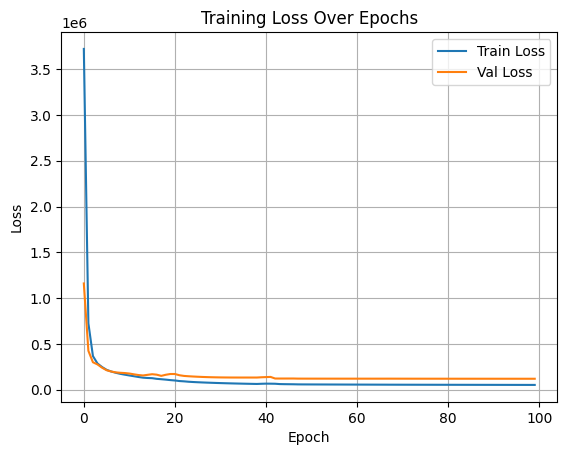

In [ ]:
plot_history(history)

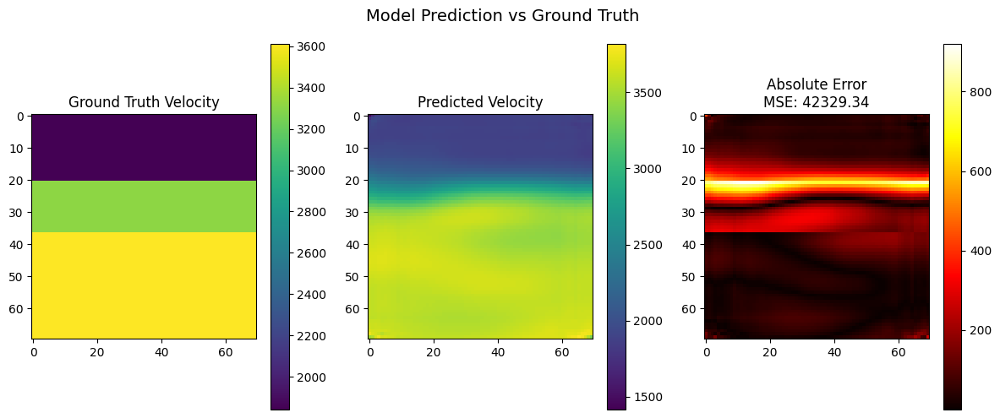

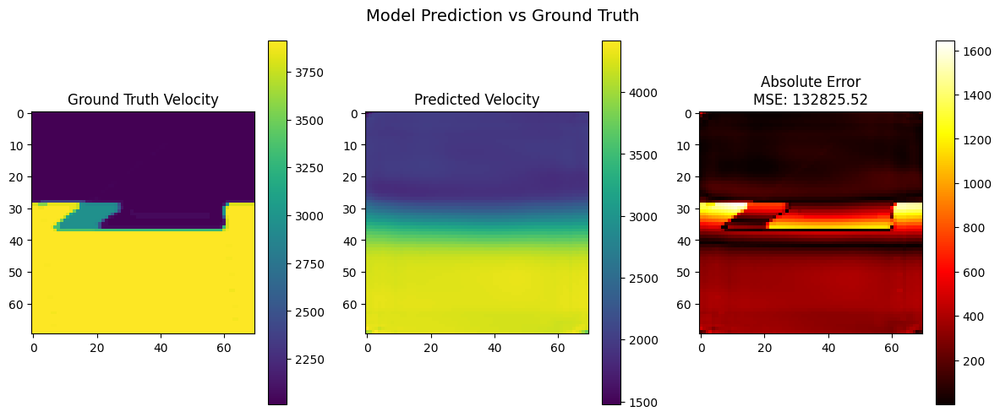

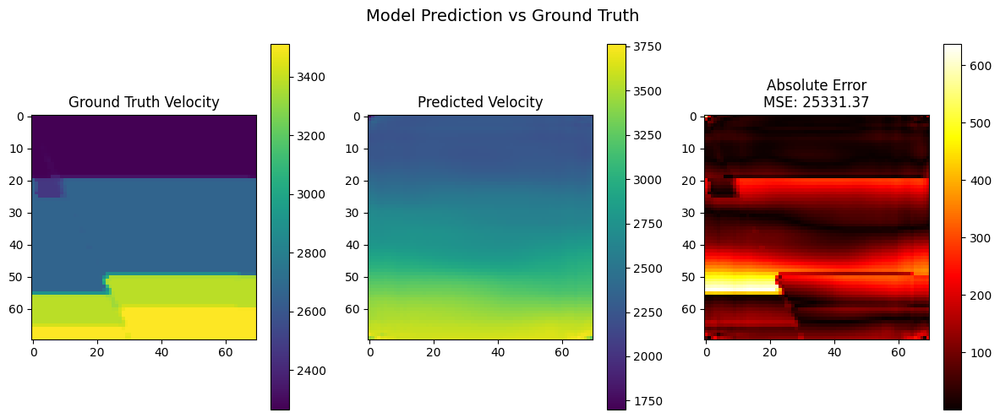

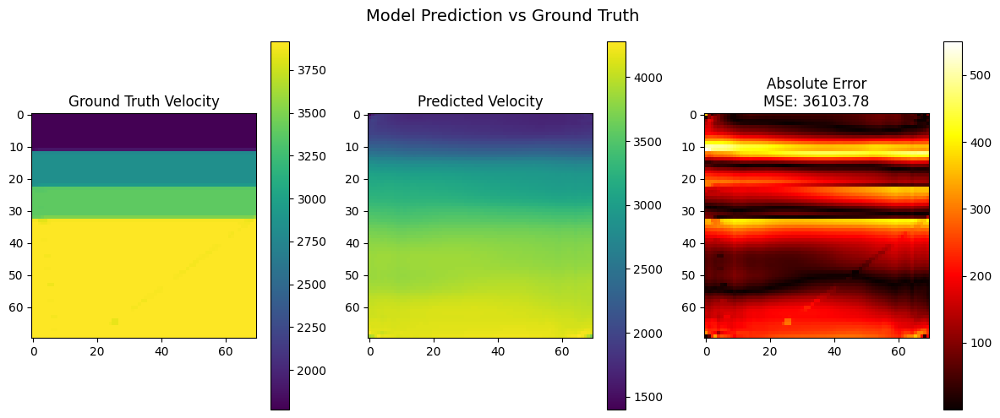

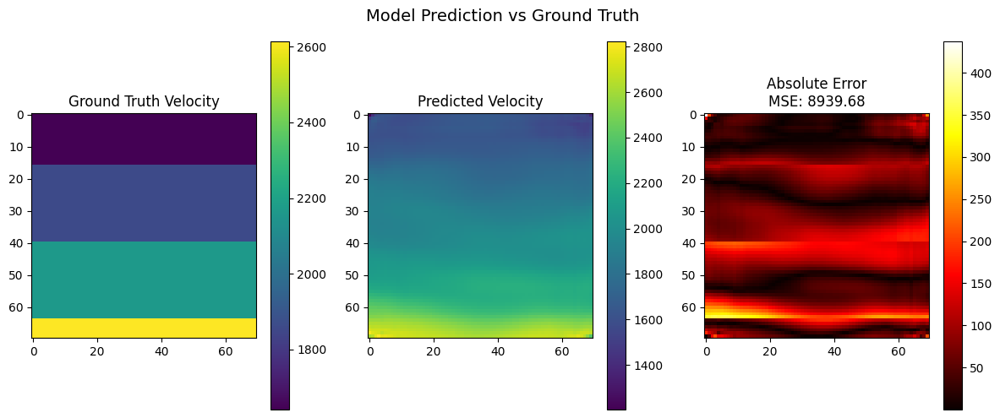

In [ ]:
for i in range(5):
    show_model_prediction(complex_model, X_train, y_train, idx=i)

Visual appearance of our model is improved, now lets attempt adding in more complexity (increasing the size of our model).

In [ ]:
complex_model_512 = build_complex_model(input_shape=(70, 1000, 5),embed_dim=512)
complex_model_512.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=composite_loss(lambda_tv=0.1, lambda_grad=0.1),
    metrics=[reconstruction_loss]
)
complex_model_512.summary()

Model: "ComplexWaveformToVelocity"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 70, 1000, 5)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_4 (Reshape)             │ (None, 70, 5000)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ temporal_embedding_5            │ (None, 70, 512)        │     2,596,352 │
│ (TemporalEmbedding)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_10 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_11 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_12 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_13 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_14 (Functional)      │ (None, 70, 70, 1)      │     1,034,177 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,543,809 (86.00 MB)

 Trainable params: 22,543,809 (86.00 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    EarlyStopping(patience=8, restore_best_weights=True, verbose=1),
    ModelCheckpoint("best_complex_model.keras", save_best_only=True, monitor="val_loss", verbose=1)
]

history = complex_model_512.fit(
    train_ds,
    validation_data=val_ds,
    epochs=200,
    callbacks=callbacks
)


Epoch 1/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 5973391.0000 - reconstruction_loss: 5973376.5000
Epoch 1: val_loss improved from inf to 1210140.87500, saving model to best_complex_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 80s 686ms/step - loss: 5939265.0000 - reconstruction_loss: 5939250.5000 - val_loss: 1210140.8750 - val_reconstruction_loss: 1208373.0000 - learning_rate: 1.0000e-04
Epoch 2/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 1035116.0625 - reconstruction_loss: 1035087.9375
Epoch 2: val_loss improved from 1210140.87500 to 598815.18750, saving model to best_complex_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 61s 823ms/step - loss: 1032653.3125 - reconstruction_loss: 1032625.2500 - val_loss: 598815.1875 - val_reconstruction_loss: 597934.3750 - learning_rate: 1.0000e-04
Epoch 3/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 600993.3750 - reconstruction_loss: 600967.8125
Epoch 3: val_loss improved from 598815.18750 to 497414.18750, saving model to best_complex_

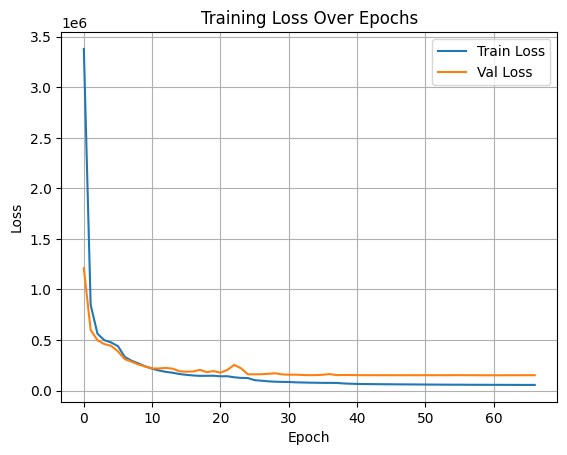

In [ ]:
plot_history(history)

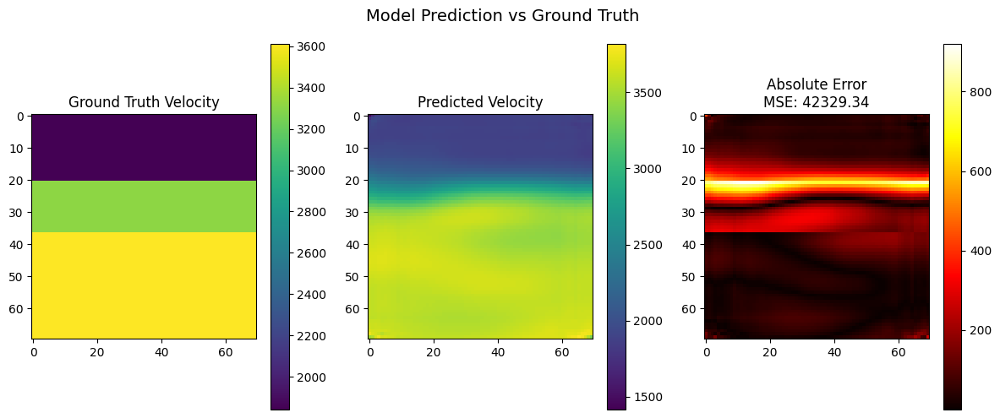

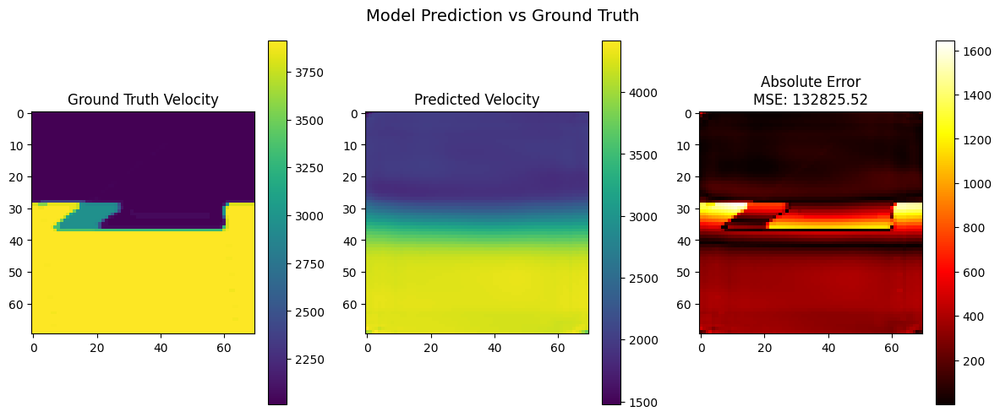

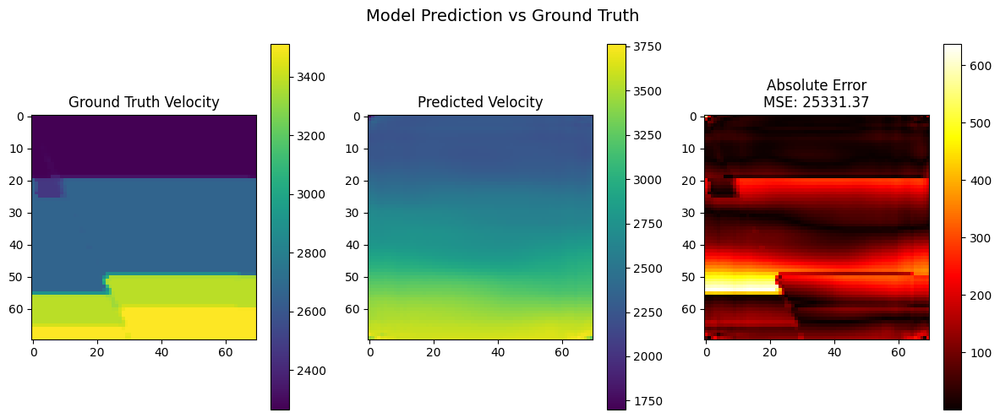

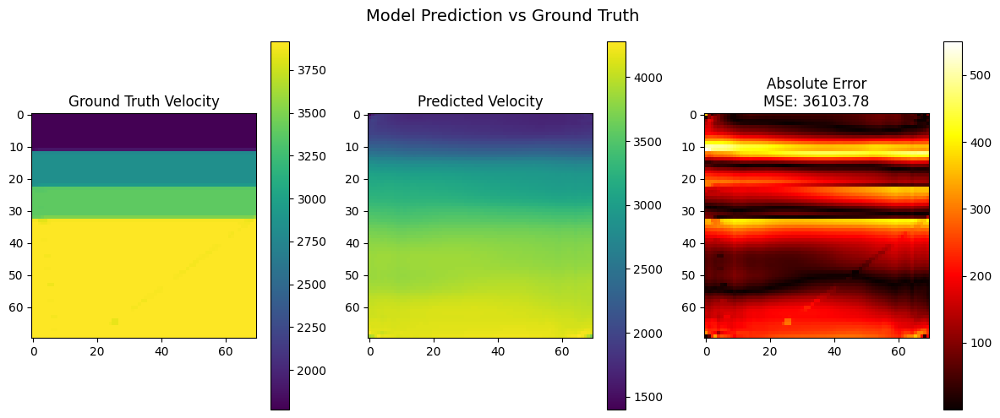

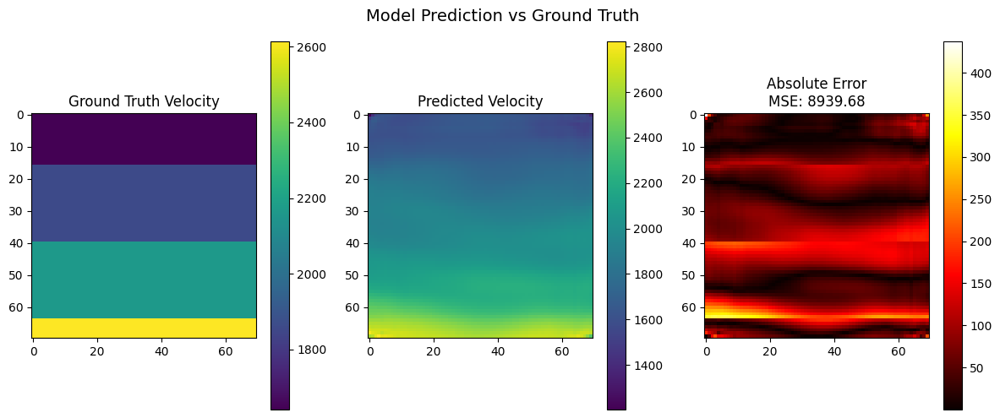

In [ ]:
for i in range(5):
    show_model_prediction(complex_model, X_train, y_train, idx=i)

These models are capturing global structures (velocity that look closer to where they are supposed to be), the over-smoothing indicates that the model is struggling with sharp physical features, especialy layer transitions and faults. We should now use physics-informed loss functions.

To help with the smoothing we will now to attempt to change our loss functions:

### **Current Composite Loss (TV + Gradient + MSE)**


| Component         |Aiming to Learn                                                     |
| ----------------- | ----------------------------------------------------------------------- |
| **MSE**           | Match overall velocity values                                           |
| **TV**            | Remove high-frequency noise                                    |
| **Gradient Loss** | Preserve true geological edges and layer structure |


In [12]:
def total_variation_loss(y_pred):
    dx = y_pred[:, :, 1:, :] - y_pred[:, :, :-1, :]
    dy = y_pred[:, 1:, :, :] - y_pred[:, :-1, :, :]
    return tf.reduce_mean(tf.abs(dx)) + tf.reduce_mean(tf.abs(dy))

def gradient_loss(y_true, y_pred):
    pred_dx = y_pred[:, :, 1:, :] - y_pred[:, :, :-1, :]
    pred_dy = y_pred[:, 1:, :, :] - y_pred[:, :-1, :, :]
    true_dx = y_true[:, :, 1:, :] - y_true[:, :, :-1, :]
    true_dy = y_true[:, 1:, :, :] - y_true[:, :-1, :, :]
    loss_dx = tf.reduce_mean(tf.abs(pred_dx - true_dx))
    loss_dy = tf.reduce_mean(tf.abs(pred_dy - true_dy))
    return loss_dx + loss_dy

def composite_loss(lambda_tv=0.2, lambda_grad=0.3):
    def loss(y_true, y_pred):
        recon = tf.reduce_mean(tf.square(y_true - y_pred))
        tv = total_variation_loss(y_pred)
        grad = gradient_loss(y_true, y_pred)
        return recon + lambda_tv * tv + lambda_grad * grad
    return loss


In [ ]:
complex_model_512_physics_informed = build_complex_model(input_shape=(70, 1000, 5),embed_dim=512)
complex_model_512_physics_informed.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=composite_loss(lambda_tv=0.1, lambda_grad=0.1),
    metrics=[reconstruction_loss]
)
complex_model_512_physics_informed.summary()

Model: "ComplexWaveformToVelocity"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 70, 1000, 5)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_3 (Reshape)             │ (None, 70, 5000)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ temporal_embedding_2            │ (None, 70, 512)        │     2,596,352 │
│ (TemporalEmbedding)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_5 (Functional)       │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_6 (Functional)       │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_7 (Functional)       │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_8 (Functional)       │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_9 (Functional)       │ (None, 70, 70, 1)      │     1,034,177 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,543,809 (86.00 MB)

 Trainable params: 22,543,809 (86.00 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    EarlyStopping(patience=8, restore_best_weights=True, verbose=1),
    ModelCheckpoint("best_complex_model_512_physics_informed.keras", save_best_only=True, monitor="val_loss", verbose=1)
]

history = complex_model_512_physics_informed.fit(
    train_ds,
    validation_data=val_ds,
    epochs=200,
    callbacks=callbacks
)


Epoch 1/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 5703996.5000 - reconstruction_loss: 5703981.0000
Epoch 1: val_loss improved from inf to 1089384.62500, saving model to best_complex_model_512_physics_informed.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 41s 211ms/step - loss: 5670741.0000 - reconstruction_loss: 5670725.5000 - val_loss: 1089384.6250 - val_reconstruction_loss: 1087805.3750 - learning_rate: 1.0000e-04
Epoch 2/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 893586.7500 - reconstruction_loss: 893559.4375
Epoch 2: val_loss improved from 1089384.62500 to 550735.06250, saving model to best_complex_model_512_physics_informed.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - loss: 891614.0000 - reconstruction_loss: 891586.6875 - val_loss: 550735.0625 - val_reconstruction_loss: 549988.6250 - learning_rate: 1.0000e-04
Epoch 3/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 555114.1250 - reconstruction_loss: 555092.3750
Epoch 3: val_loss improved from 550735.06250 to 33298

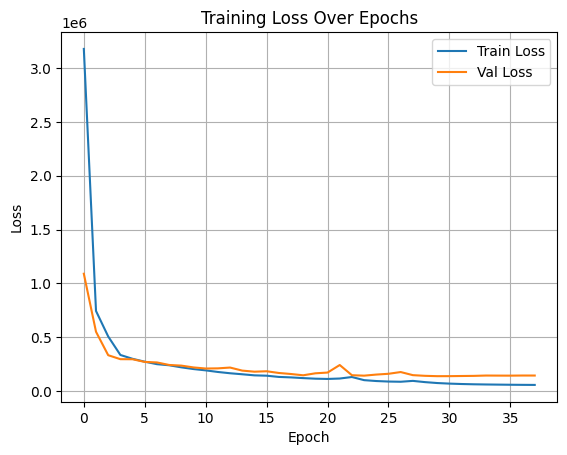

In [ ]:
plot_history(history)

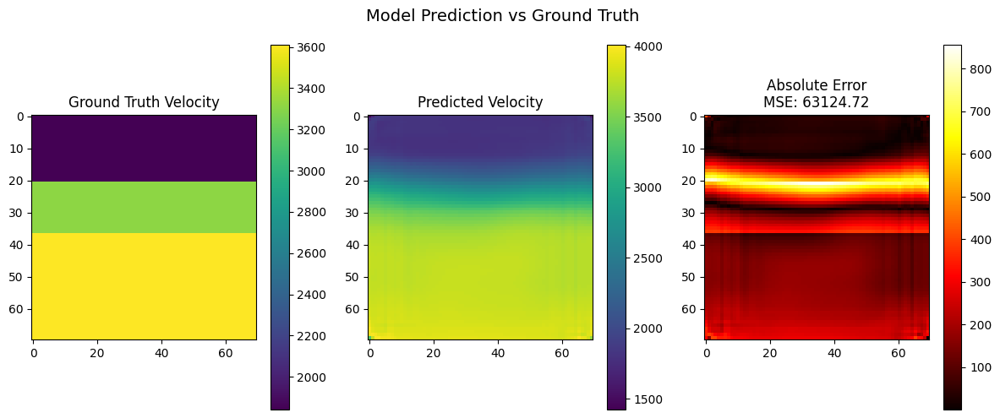

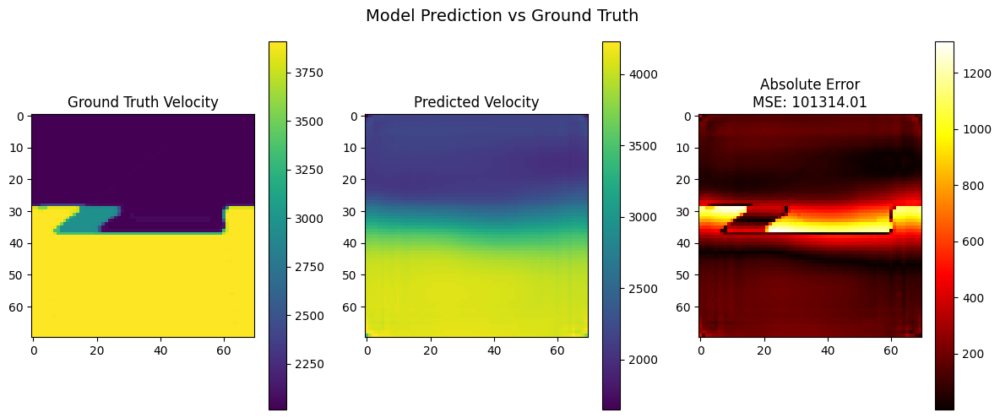

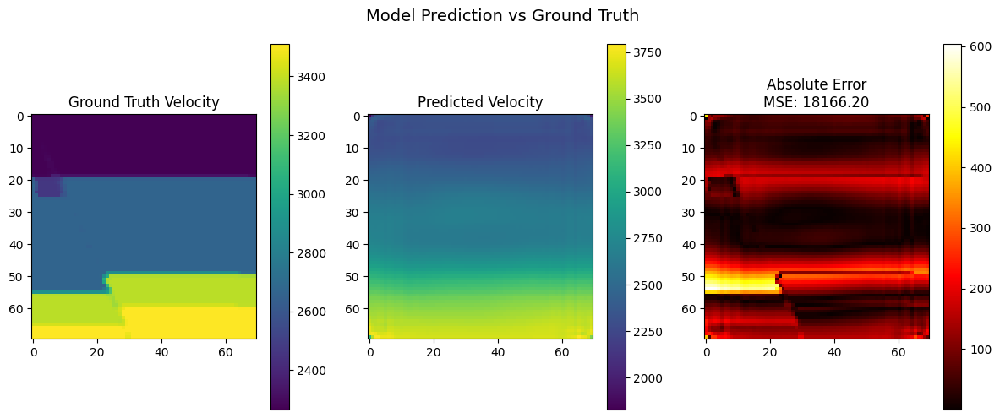

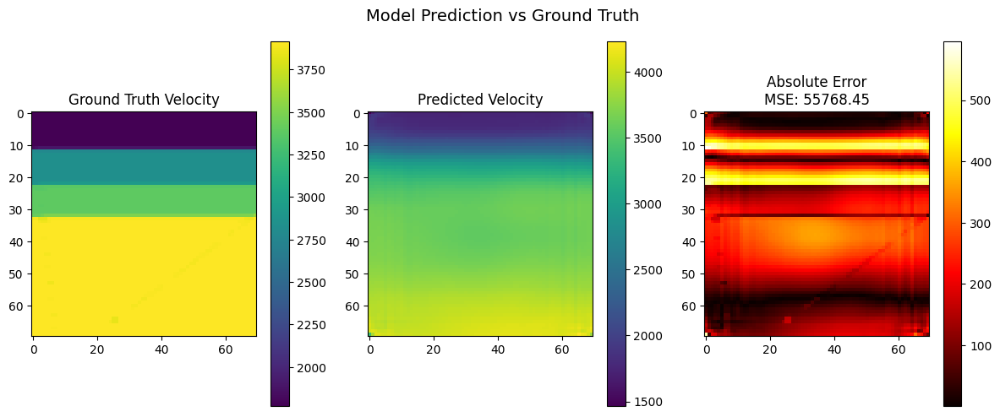

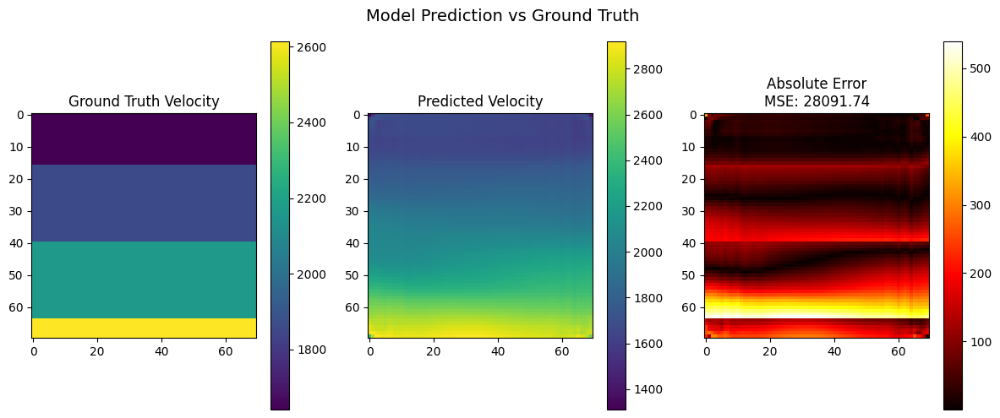

In [ ]:
for i in range(5):
    show_model_prediction(complex_model_512_physics_informed, X_train, y_train, idx=i)

We are still seeing a lot of smoothing, however there seems to be some general layer ordering and average veloicty look to match up.  To help with the smoothing we will attempt to make the composite_loss stronger: lambda_tv =0.1, lambda_grad=1.0



In [ ]:
complex_model_512_physics_informed_stronger_loss = build_complex_model(input_shape=(70, 1000, 5),embed_dim=512)
complex_model_512_physics_informed_stronger_loss.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=composite_loss(lambda_tv=0.1, lambda_grad=1),
    metrics=[reconstruction_loss]
)
complex_model_512_physics_informed_stronger_loss.summary()

Model: "ComplexWaveformToVelocity"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 70, 1000, 5)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_5 (Reshape)             │ (None, 70, 5000)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ temporal_embedding_3            │ (None, 70, 512)        │     2,596,352 │
│ (TemporalEmbedding)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_10 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_11 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_12 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_13 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_14 (Functional)      │ (None, 70, 70, 1)      │     1,034,177 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,543,809 (86.00 MB)

 Trainable params: 22,543,809 (86.00 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    EarlyStopping(patience=8, restore_best_weights=True, verbose=1),
    ModelCheckpoint("complex_model_512_physics_informed_stronger_loss.keras", save_best_only=True, monitor="val_loss", verbose=1)
]

history = complex_model_512_physics_informed_stronger_loss.fit(
    train_ds,
    validation_data=val_ds,
    epochs=200,
    callbacks=callbacks
)


Epoch 1/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 6204561.0000 - reconstruction_loss: 6204472.0000
Epoch 1: val_loss improved from inf to 1234379.87500, saving model to complex_model_512_physics_informed_stronger_loss.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 36s 207ms/step - loss: 6169633.5000 - reconstruction_loss: 6169544.0000 - val_loss: 1234379.8750 - val_reconstruction_loss: 1232541.0000 - learning_rate: 1.0000e-04
Epoch 2/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 1058685.0000 - reconstruction_loss: 1058515.8750
Epoch 2: val_loss improved from 1234379.87500 to 642233.56250, saving model to complex_model_512_physics_informed_stronger_loss.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 1056392.6250 - reconstruction_loss: 1056223.3750 - val_loss: 642233.5625 - val_reconstruction_loss: 640961.9375 - learning_rate: 1.0000e-04
Epoch 3/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 608406.3125 - reconstruction_loss: 608250.2500
Epoch 3: val_loss improved from

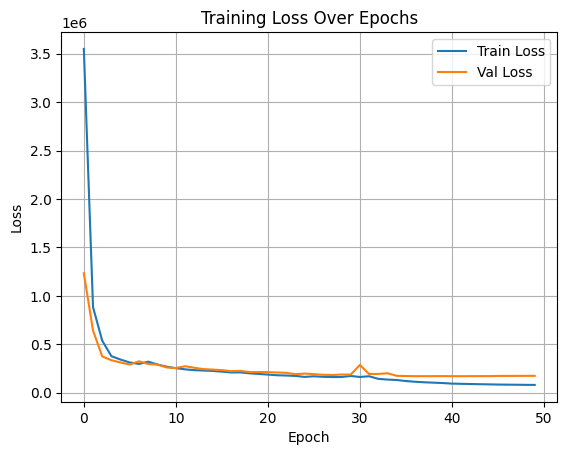

In [ ]:
plot_history(history)

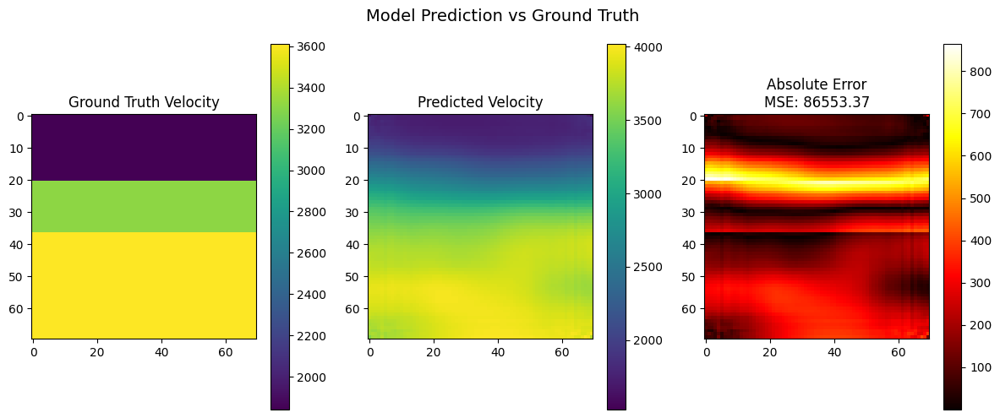

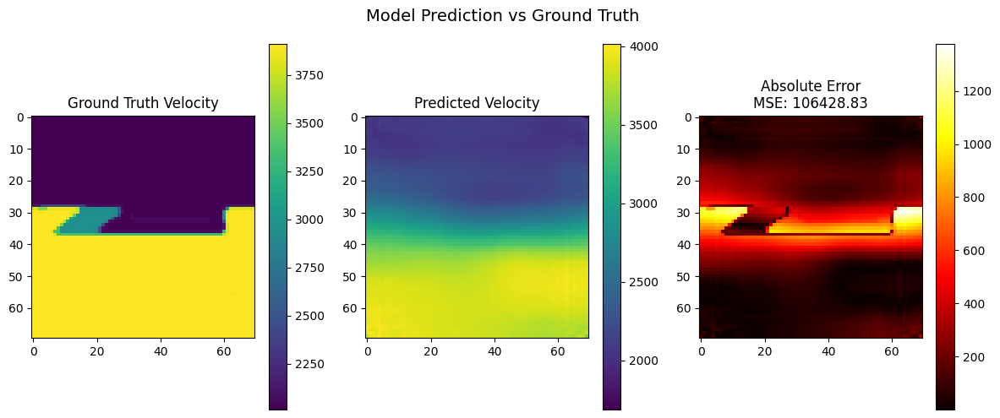

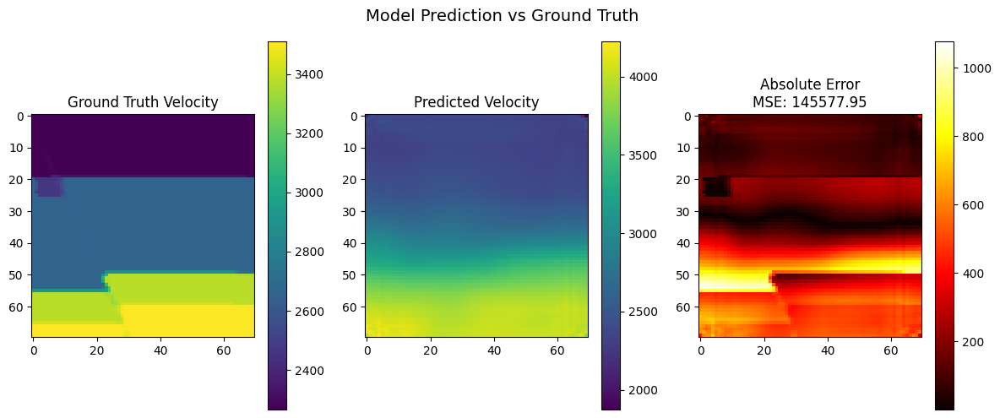

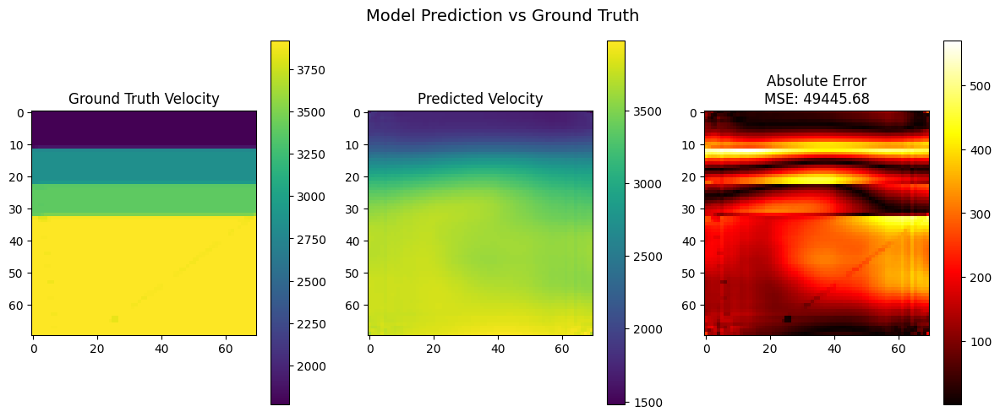

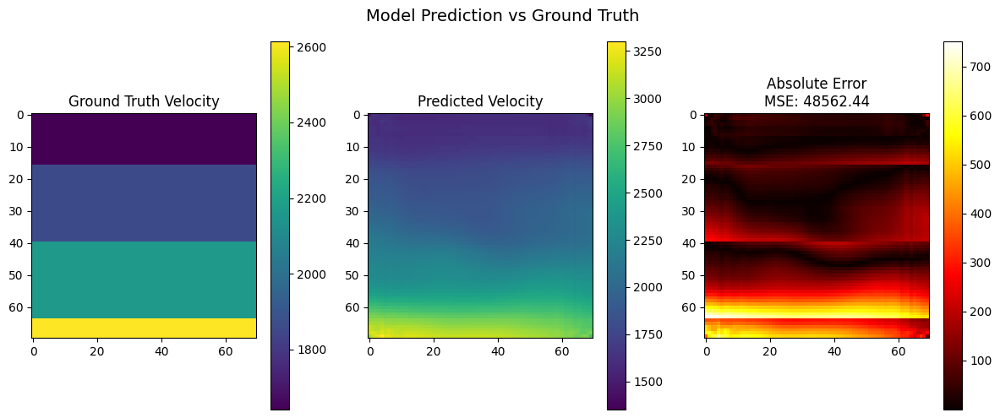

In [ ]:
for i in range(5):
    show_model_prediction(complex_model_512_physics_informed_stronger_loss, X_train, y_train, idx=i)

Due to the smoothness that we are still seeing, we will try reducing the lambda_tv value to 0.001 to lower smoothness and have more homogenous areas.

In [ ]:
complex_model_512_physics_informed_stronger_loss_less_smooth = build_complex_model(input_shape=(70, 1000, 5),embed_dim=512)
complex_model_512_physics_informed_stronger_loss_less_smooth.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=composite_loss(lambda_tv=0.001, lambda_grad=1),
    metrics=[reconstruction_loss]
)
complex_model_512_physics_informed_stronger_loss_less_smooth.summary()

Model: "ComplexWaveformToVelocity"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_27 (InputLayer)     │ (None, 70, 1000, 5)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_9 (Reshape)             │ (None, 70, 5000)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ temporal_embedding_5            │ (None, 70, 512)        │     2,596,352 │
│ (TemporalEmbedding)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_20 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_21 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_22 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_23 (Functional)      │ (None, 70, 512)        │     4,728,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_24 (Functional)      │ (None, 70, 70, 1)      │     1,034,177 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,543,809 (86.00 MB)

 Trainable params: 22,543,809 (86.00 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    EarlyStopping(patience=8, restore_best_weights=True, verbose=1),
    ModelCheckpoint("complex_model_512_physics_informed_stronger_loss_less_smooth.keras", save_best_only=True, monitor="val_loss", verbose=1)
]

history = complex_model_512_physics_informed_stronger_loss_less_smooth.fit(
    train_ds,
    validation_data=val_ds,
    epochs=200,
    callbacks=callbacks
)

Epoch 1/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 5917887.0000 - reconstruction_loss: 5917802.5000
Epoch 1: val_loss improved from inf to 1110173.50000, saving model to complex_model_512_physics_informed_stronger_loss_less_smooth.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 34s 193ms/step - loss: 5883778.5000 - reconstruction_loss: 5883693.5000 - val_loss: 1110173.5000 - val_reconstruction_loss: 1108465.6250 - learning_rate: 1.0000e-04
Epoch 2/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 906713.8125 - reconstruction_loss: 906568.0625
Epoch 2: val_loss improved from 1110173.50000 to 571268.75000, saving model to complex_model_512_physics_informed_stronger_loss_less_smooth.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 904638.9375 - reconstruction_loss: 904493.1875 - val_loss: 571268.7500 - val_reconstruction_loss: 570578.2500 - learning_rate: 1.0000e-04
Epoch 3/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 571953.7500 - reconstruction_loss: 571819.2500
Epoch 3: va

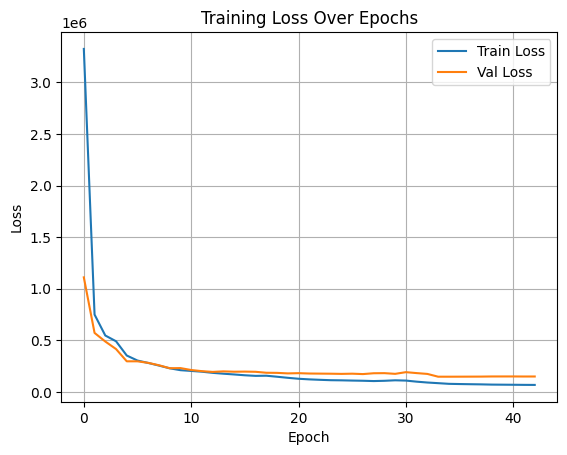

In [ ]:
plot_history(history)

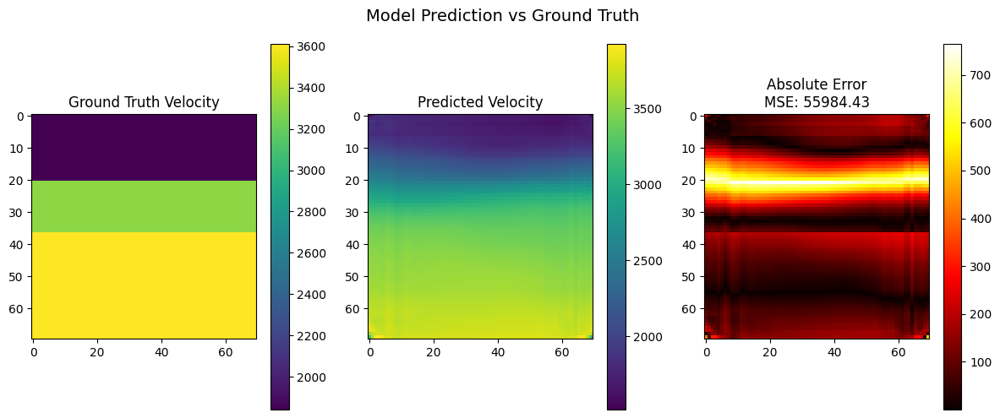

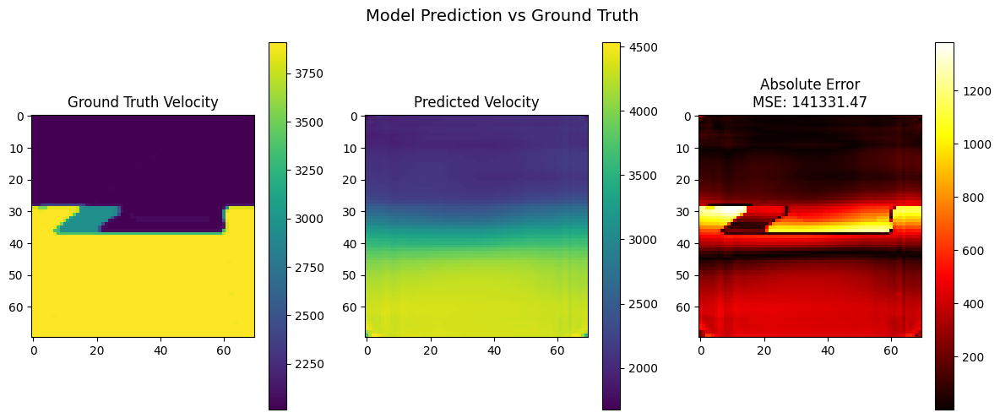

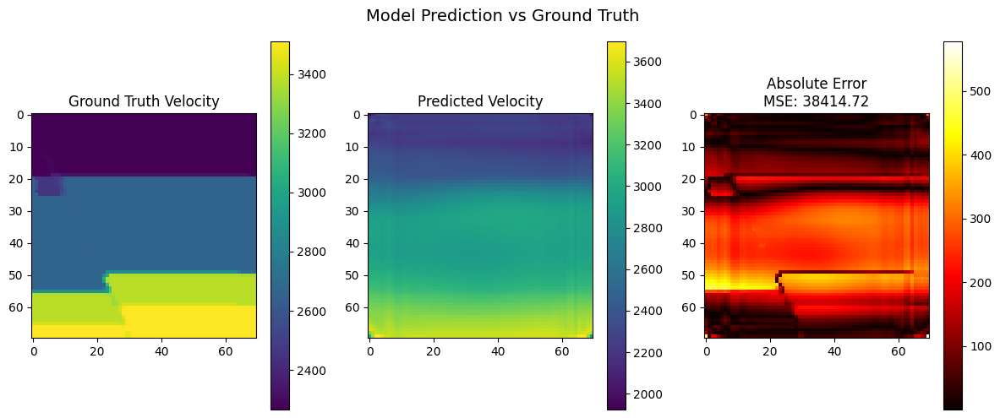

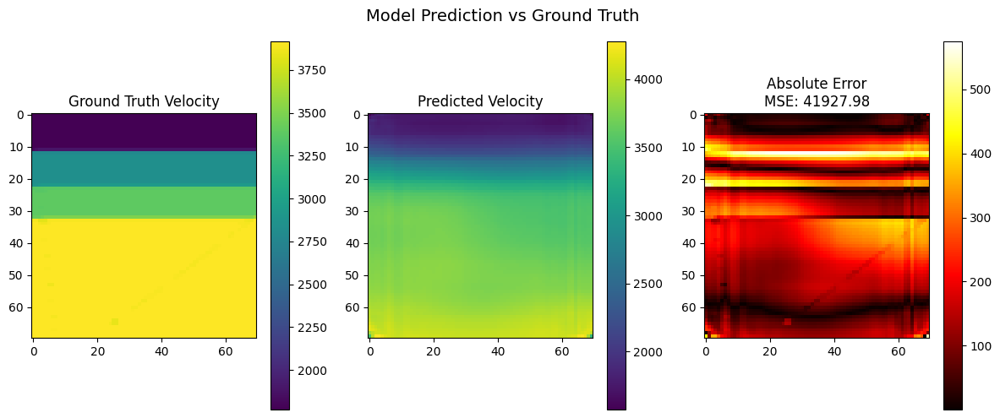

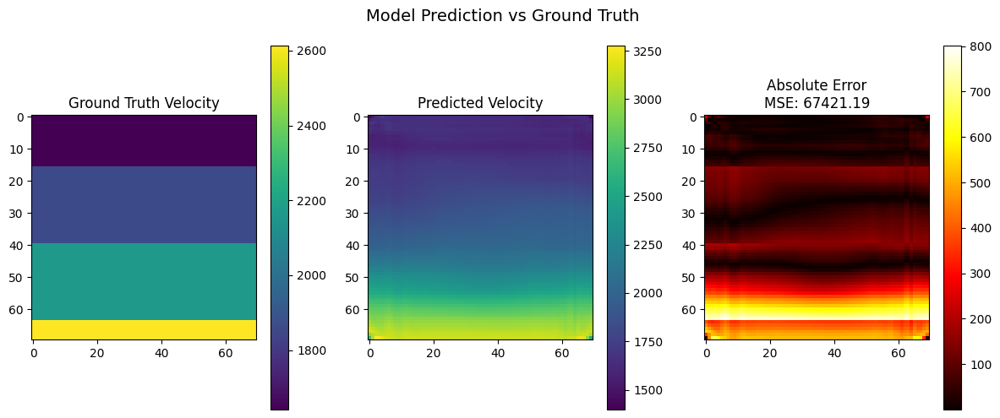

In [ ]:
for i in range(5):
    show_model_prediction(complex_model_512_physics_informed_stronger_loss_less_smooth, X_train, y_train, idx=i)

# Step 3: Curriculum Learning

Now that we have an idea of what our model may look like and what may be good loss functions to use we will now see how we can incorporate the different complexity of models.  In order to do this we will use: Curriculum learning.

Curriculum learning is a training strategy inspired by how humans learn: we start with simple concepts and gradually build up to more complex material.

We start by presenting the model with easier examples first then, gradually introducing harder, more complex data.  This allows the model to learn foundational patterns before tackling the full complexity of the task.

Bengio et al. (2009): Introduced the concept of curriculum learning, demonstrating that training models on easier examples before harder ones can lead to better generalization and faster convergence. Weinshall et al. (2018): Provided theoretical and empirical evidence that curriculum learning accelerates convergence and improves generalization, especially in deep networks.

The goal of this would be to improve convergence speed, reduce overfitting on hard examples too early and increase generalization

Our data sets are split into different phases of the curriculum.

* **Phase 1: Simple horizontal structures**
  `FlatVel_A`, `FlatFault_A`
* **Phase 2: Introduced curved velocity fields**
  Added `CurveVel_A/B`
* **Phase 3: Full complexity**
  Included faults, styles, and irregular layering like `Style_A/B`, `CurveFault_A/B`

Rather than replacing the training data at each phase, we accumulated all prior phase data::

* Phase 2 trains on **Phase 1 + 2**
* Phase 3 trains on **Phases 1 + 2 + 3**

We trained a single, transformer-based model with physics-informed loss (MSE + TV + gradient) across all phases:


In [13]:
BATCH_SIZE = 4
EPOCHS_PER_PHASE = 500
save_dir = '/content/drive/MyDrive/CU/waveform-data'

# Curriculum Phase Dataset Definitions
curriculum_phases = [
    [  # Phase 1: Simple flat structures
        ['FlatVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['FlatFault_A', 'seis2_1_0.npy', 'vel2_1_0.npy', 'medium'],
        ['FlatFault_A', 'seis4_1_0.npy', 'vel4_1_0.npy', 'medium']
    ],
    [  # Phase 2: Curved layers + Phase 1
     ['FlatVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['FlatFault_A', 'seis2_1_0.npy', 'vel2_1_0.npy', 'medium'],
        ['FlatFault_A', 'seis4_1_0.npy', 'vel4_1_0.npy', 'medium'],
        ['CurveVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['CurveVel_B', 'data/data1.npy', 'model/model1.npy', 'easy']
    ],
    [  # Phase 3: Full complexity (faults, style variations) + Phase 2 + Phase 1
    ['FlatVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['FlatFault_A', 'seis2_1_0.npy', 'vel2_1_0.npy', 'medium'],
        ['FlatFault_A', 'seis4_1_0.npy', 'vel4_1_0.npy', 'medium'],
        ['CurveVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['CurveVel_B', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['Style_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['Style_B', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['CurveFault_A', 'seis2_1_0.npy', 'vel2_1_0.npy', 'medium'],
        ['CurveFault_A', 'seis4_1_0.npy', 'vel4_1_0.npy', 'medium'],
        ['CurveFault_B', 'seis6_1_0.npy', 'vel6_1_0.npy', 'medium'],
        ['CurveFault_B', 'seis8_1_0.npy', 'vel8_1_0.npy', 'medium'],
    ]
]

def load_phase_data(data_file_list, work_dir):
    X_all, y_all = [], []
    for dataset_name, x_file, y_file, _ in data_file_list:
        x_path = os.path.join(work_dir, dataset_name, x_file)
        y_path = os.path.join(work_dir, dataset_name, y_file)
        X = np.load(x_path, mmap_mode='r')
        y = np.load(y_path, mmap_mode='r')
        X_all.append(X)
        y_all.append(y)
    X_all = np.concatenate(X_all, axis=0)
    y_all = np.concatenate(y_all, axis=0)
    return X_all, y_all

def normalize_waveforms(X):
    mean = np.mean(X, axis=(2, 3), keepdims=True)
    std = np.std(X, axis=(2, 3), keepdims=True) + 1e-8
    return (X - mean) / std

def prepare_tf_dataset(X, y):
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
    y_train = np.transpose(y_train, (0, 2, 3, 1))  # (B, H, W, 1)
    y_val = np.transpose(y_val, (0, 2, 3, 1))
    train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return train_ds, val_ds

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    EarlyStopping(patience=8, restore_best_weights=True, verbose=1),
    ModelCheckpoint(os.path.join(save_dir,"model_checkpoints.keras"), save_best_only=True, monitor="val_loss", verbose=1)
]


In [ ]:

model = build_complex_model(input_shape=(70,1000,5),embed_dim=1024)
model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss=composite_loss(lambda_tv=0.001, lambda_grad=1),
        metrics=[reconstruction_loss]
    )
model.summary()
for phase_idx, phase_data_file_list in enumerate(curriculum_phases, 1):
    print(f"\n=== Starting Phase {phase_idx} Training ===")

    # 1. Load and preprocess data
    X_phase, y_phase = load_phase_data(phase_data_file_list, work_dir)
    X_phase_norm = normalize_waveforms(X_phase)
    X_phase_norm = np.transpose(X_phase_norm, (0, 3, 2, 1))  # (N, 70, 1000, 5)
    train_ds, val_ds = prepare_tf_dataset(X_phase_norm, y_phase)


    # 3. Train
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS_PER_PHASE,
        callbacks=callbacks
    )

    # Optionally: save model per phase
    model.save(os.path.join(save_dir,f'model_phase{phase_idx}.keras'))

    # Optionally visualize or evaluate on validation set
    print(f"Completed Phase {phase_idx}.\n")


Model: "ComplexWaveformToVelocity"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 70, 1000, 5)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 70, 5000)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ temporal_embedding_1            │ (None, 70, 1024)       │     5,192,704 │
│ (TemporalEmbedding)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional (Functional)         │ (None, 70, 1024)       │    17,844,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_1 (Functional)       │ (None, 70, 1024)       │    17,844,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_2 (Functional)       │ (None, 70, 1024)       │    17,844,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_3 (Functional)       │ (None, 70, 1024)       │    17,844,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_4 (Functional)       │ (None, 70, 70, 1)      │     1,624,001 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 78,195,649 (298.29 MB)

 Trainable params: 78,195,649 (298.29 MB)

 Non-trainable params: 0 (0.00 B)


=== Starting Phase 1 Training ===
Epoch 1/500


KeyboardInterrupt: 

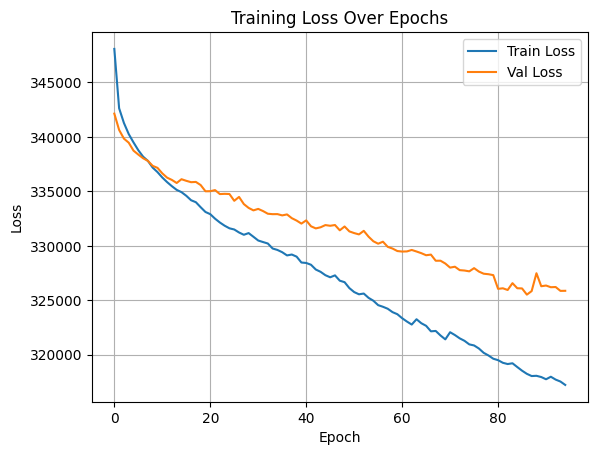

In [ ]:
plot_history(history)

In [14]:
def extract_numpy_from_dataset(dataset, max_batches=5):
    X_val_list, y_val_list = [], []
    for i, (x, y) in enumerate(dataset):
        if i >= max_batches:
            break
        X_val_list.append(x.numpy())
        y_val_list.append(y.numpy())
    X_val = np.concatenate(X_val_list, axis=0)
    y_val = np.concatenate(y_val_list, axis=0)
    return X_val, y_val

def show_random_velocity_predictions(model, X_val, y_val, num_samples=5):
    indices = np.random.choice(len(X_val), size=num_samples, replace=False)
    preds = model.predict(X_val[indices])

    for i, idx in enumerate(indices):
        plt.figure(figsize=(12, 4))

        # Ground Truth
        plt.subplot(1, 3, 1)
        plt.imshow(y_val[idx, :, :, 0], cmap='viridis')
        plt.title(f"Ground Truth #{idx}")
        plt.colorbar(label='Velocity')
        plt.axis('off')

        # Prediction
        plt.subplot(1, 3, 2)
        plt.imshow(preds[i, :, :, 0], cmap='viridis')
        plt.title("Model Prediction")
        plt.colorbar(label='Velocity')
        plt.axis('off')

        # Absolute Error
        plt.subplot(1, 3, 3)
        error = np.abs(preds[i, :, :, 0] - y_val[idx, :, :, 0])
        plt.imshow(error, cmap='magma')
        plt.title("Absolute Error")
        plt.colorbar(label='|Pred − GT|')
        plt.axis('off')

        plt.tight_layout()
        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


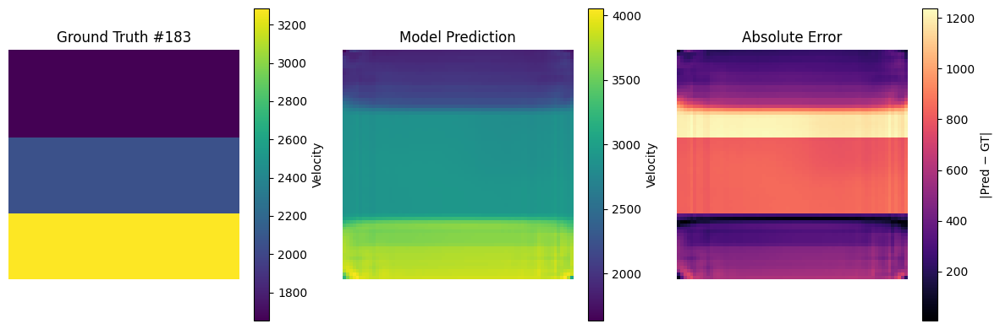

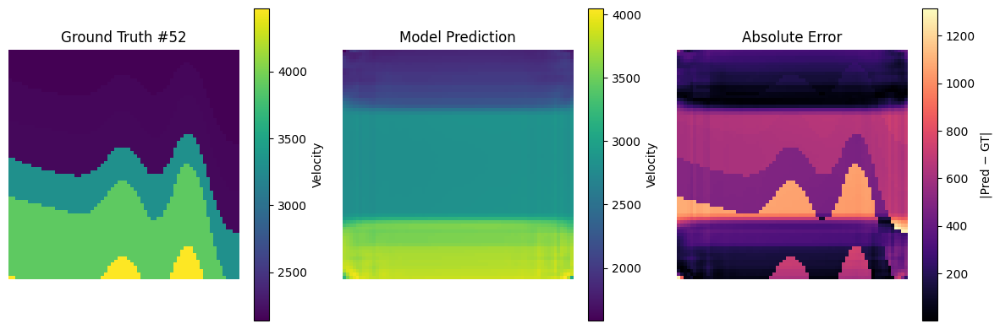

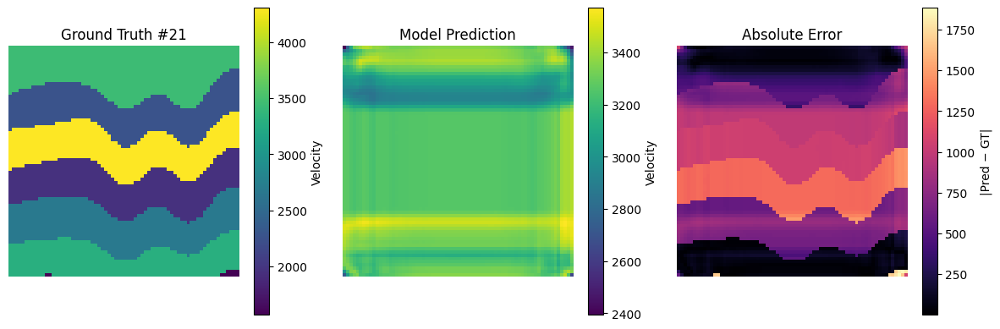

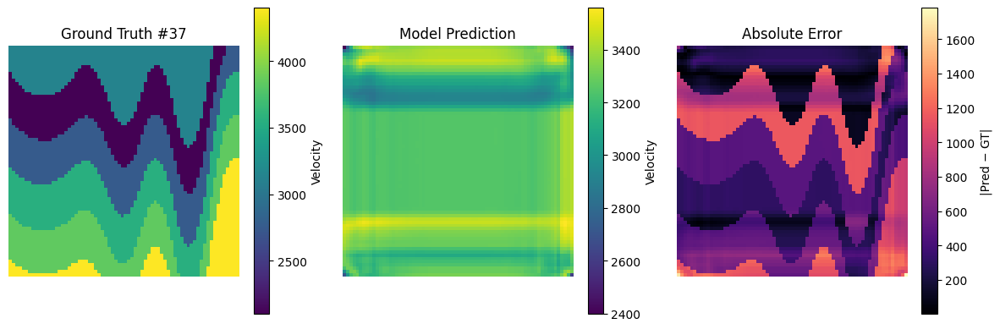

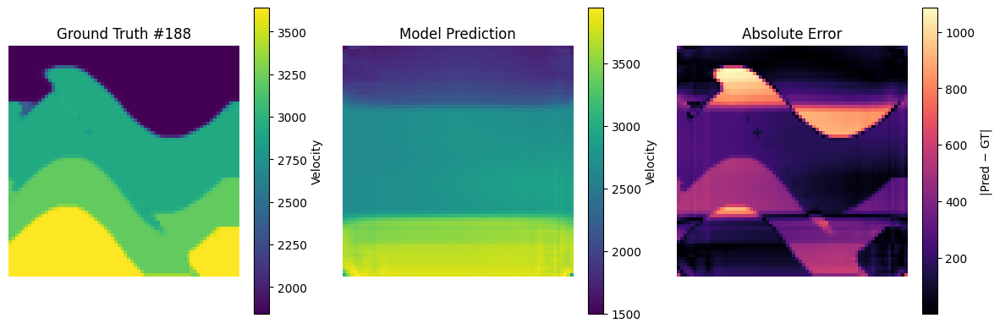

In [ ]:
X_val_np, y_val_np = extract_numpy_from_dataset(val_ds, max_batches=3)
show_random_velocity_predictions(model, X_val_np, y_val_np, num_samples=5)


#Findings:
Build more complex model: add skip connections in a U-Net style decoder
by adding skip connections in a U-Net-style decoder it helps us preserve spatial and temporal fidelity. It helps retain important details (e.g., layer boundaries, waveform subtleties) that might otherwise be lost in the encoding/transformer layers.

In [15]:
def unet_decoder(x, skip_input, output_shape=(70, 70, 1), embed_dim=1024):
    # Concatenate transformer output and skip connection → (batch, 70, 2048)
    x = layers.Concatenate()([x, skip_input])  # shape: (batch, 70, 2048)

    # Reshape into 2D spatial map: (10, 14, 1024)
    x = layers.Reshape((10, 14, 2048))(x)  # 10×14×1024 = 143360

    # 10×14 → 20×28
    x = layers.Conv2DTranspose(512, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(512, 3, padding='same', activation='relu')(x)

    # 20×28 → 40×56
    x = layers.Conv2DTranspose(256, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(256, 3, padding='same', activation='relu')(x)

    # 40×56 → 80×112
    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, 3, padding='same', activation='relu')(x)

    # Crop down to 70×70
    x = layers.Cropping2D(((5, 5), (21, 21)))(x)

    # Final 1×1 conv to get velocity output
    output = layers.Conv2D(output_shape[-1], 1, activation='linear')(x)
    return output


In [16]:
def build_complex_model(input_shape=(70, 1000, 5), embed_dim=512, num_blocks=4):
    inputs = tf.keras.Input(shape=input_shape)

    # Reshape (B, 70, 1000, 5) → (B, 70, 5000)
    x_flat = layers.Reshape((input_shape[0], input_shape[1] * input_shape[2]))(inputs)

    # Temporal embedding
    skip_input = TemporalEmbedding(input_dim=x_flat.shape[-1], embed_dim=embed_dim)(x_flat)

    # Transformer blocks
    x = skip_input
    for _ in range(num_blocks):
        x = transformer_encoder(embed_dim)(x)

    # Decoder with skip connections
    output = unet_decoder(x, skip_input, embed_dim=embed_dim)


    model = tf.keras.Model(inputs, output, name="ComplexWaveformToVelocity")
    return model


[1]: https://sites.google.com/msu.edu/wei-seismic-training/seismic-time-series-data?utm_source=chatgpt.com "Seismic Time Series Data - Google Sites"
[2]: https://www.nature.com/articles/s43247-024-01243-8?utm_source=chatgpt.com "Full seismic waveform analysis combined with transformer neural ..."
[3]: https://arxiv.org/abs/2409.03536?utm_source=chatgpt.com "Physics-informed Neural Networks with Fourier Features for Seismic Wavefield Simulation in Time-Domain Nonsmooth Complex Media"


In [ ]:
# Curriculum Learning Loop
model = build_complex_model(input_shape=(70,1000,5),embed_dim=1024)
model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss=composite_loss(lambda_tv=0.001, lambda_grad=1),
        metrics=[reconstruction_loss]
    )
model.summary()
for phase_idx, phase_data_file_list in enumerate(curriculum_phases, 1):
    print(f"\n=== Starting Phase {phase_idx} Training ===")

    X_phase, y_phase = load_phase_data(phase_data_file_list, work_dir)
    X_phase_norm = normalize_waveforms(X_phase)
    X_phase_norm = np.transpose(X_phase_norm, (0, 3, 2, 1))  # (N, 70, 1000, 5)
    train_ds, val_ds = prepare_tf_dataset(X_phase_norm, y_phase)


    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS_PER_PHASE,
        callbacks=callbacks
    )

    model.save(os.path.join(save_dir,f'model_phase_unet_{phase_idx}.keras'))

    print(f"Completed Phase {phase_idx}.\n")

Model: "ComplexWaveformToVelocity"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_74      │ (None, 70, 1000,  │          0 │ -                 │
│ (InputLayer)        │ 5)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_37          │ (None, 70, 5000)  │          0 │ input_layer_74[0… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ temporal_embedding… │ (None, 70, 1024)  │  5,192,704 │ reshape_37[0][0]  │
│ (TemporalEmbedding) │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_57       │ (None, 70, 1024)  │ 17,844,736 │ temporal_embeddi… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_58       │ (None, 70, 1024)  │ 17,844,736 │ functional_57[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_59       │ (None, 70, 1024)  │ 17,844,736 │ functional_58[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_60       │ (None, 70, 1024)  │ 17,844,736 │ functional_59[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_9       │ (None, 70, 2048)  │          0 │ functional_60[0]… │
│ (Concatenate)       │                   │            │ temporal_embeddi… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_38          │ (None, 10, 14,    │          0 │ concatenate_9[0]… │
│ (Reshape)           │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_31 │ (None, 20, 28,    │  4,719,104 │ reshape_38[0][0]  │
│ (Conv2DTranspose)   │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_48 (Conv2D)  │ (None, 20, 28,    │  2,359,808 │ conv2d_transpose… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_32 │ (None, 40, 56,    │  1,179,904 │ conv2d_48[0][0]   │
│ (Conv2DTranspose)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_49 (Conv2D)  │ (None, 40, 56,    │    590,080 │ conv2d_transpose… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_33 │ (None, 80, 112,   │    295,040 │ conv2d_49[0][0]   │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_50 (Conv2D)  │ (None, 80, 112,   │    147,584 │ conv2d_transpose… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cropping2d_7        │ (None, 70, 70,    │          0 │ conv2d_50[0][0]   │
│ (Cropping2D)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_51 (Conv2D)  │ (None, 70, 70, 1) │        129 │ cropping2d_7[0][

 Total params: 85,863,297 (327.54 MB)

 Trainable params: 85,863,297 (327.54 MB)

 Non-trainable params: 0 (0.00 B)


=== Starting Phase 1 Training ===
Epoch 1/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 9185626.0000 - reconstruction_loss: 9182211.0000   
Epoch 1: val_loss did not improve from 297030.28125
19/19 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - loss: 9147858.0000 - reconstruction_loss: 9141406.0000 - val_loss: 2046858.8750 - val_reconstruction_loss: 2039167.3750 - learning_rate: 1.0000e-04
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 1602824.5000 - reconstruction_loss: 1601277.6250
Epoch 2: val_loss did not improve from 297030.28125
19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 1585515.7500 - reconstruction_loss: 1583553.8750 - val_loss: 553270.0625 - val_reconstruction_loss: 553306.6250 - learning_rate: 1.0000e-04
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 566661.6875 - reconstruction_loss: 566293.2500
Epoch 3: val_loss did not improve from 297030.28125
19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 565298.6250 - reconstruction_loss: 564838.8125 - val_l

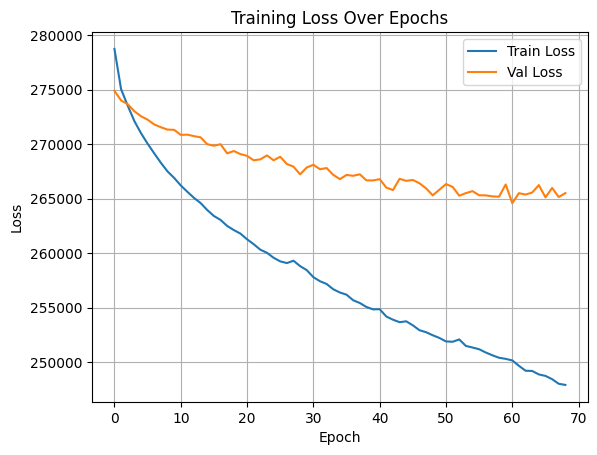

In [ ]:
plot_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


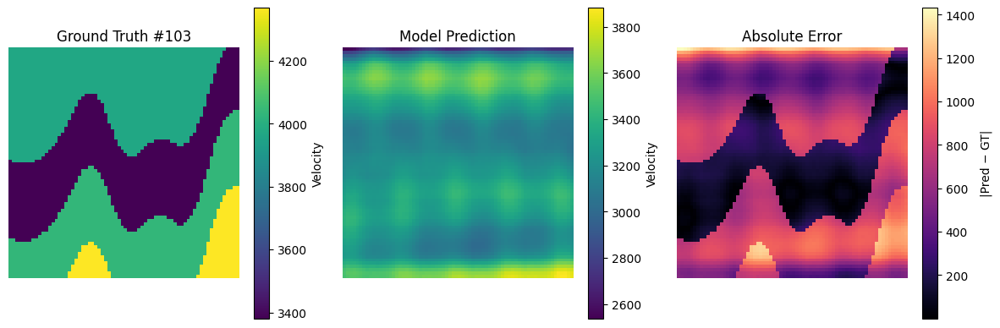

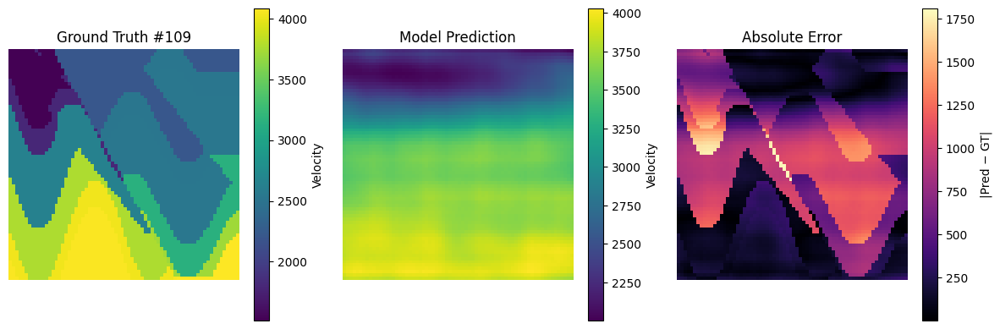

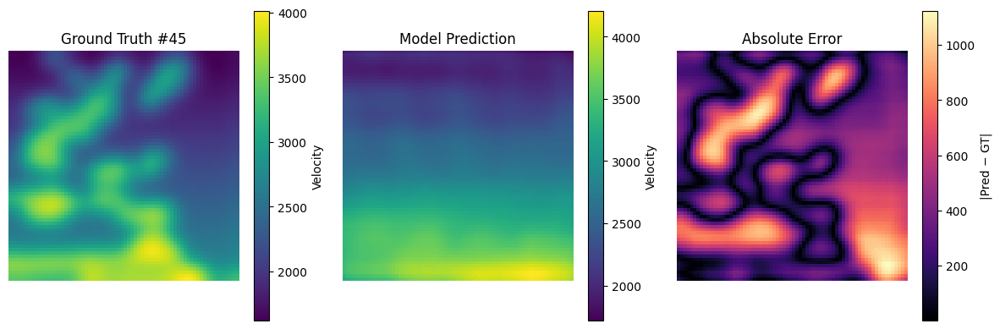

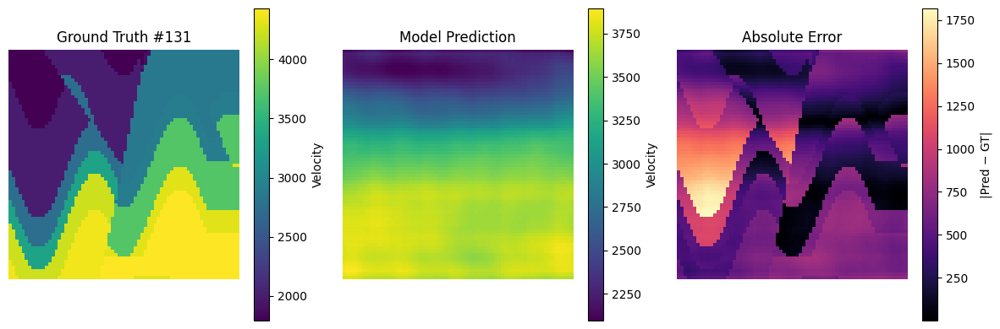

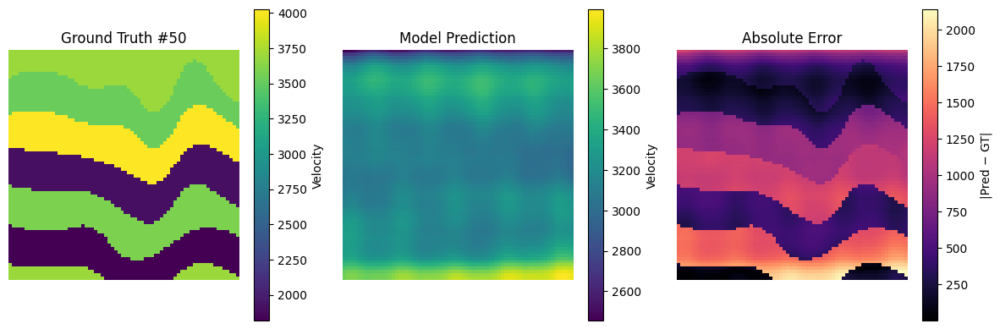

In [ ]:
show_random_velocity_predictions(model, X_val_np, y_val_np, num_samples=5)


# Findings

**Predictions are overly smooth**:The model is producing blurry outputs that miss boundaries seen in the ground truth. This indicates underfitting, especially on features that involve edges or abrupt changes in the velocity field.

We should increase the model’s capacity, We do this by increasing the embedding dimensions from 1024 to 2048 and add increase transformer blocks to 12.


In [ ]:
# Curriculum Learning Loop
from tensorflow import keras
with strategy.scope():
  curriculum_phases = [
      [  # Phase 3: Full complexity (faults, style variations) + Phase 2 + Phase 1
      ['FlatVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
          ['FlatFault_A', 'seis2_1_0.npy', 'vel2_1_0.npy', 'medium'],
          ['FlatFault_A', 'seis4_1_0.npy', 'vel4_1_0.npy', 'medium'],
          ['CurveVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
          ['CurveVel_B', 'data/data1.npy', 'model/model1.npy', 'easy'],
          ['Style_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
          ['Style_B', 'data/data1.npy', 'model/model1.npy', 'easy'],
          ['CurveFault_A', 'seis2_1_0.npy', 'vel2_1_0.npy', 'medium'],
          ['CurveFault_A', 'seis4_1_0.npy', 'vel4_1_0.npy', 'medium'],
          ['CurveFault_B', 'seis6_1_0.npy', 'vel6_1_0.npy', 'medium'],
          ['CurveFault_B', 'seis8_1_0.npy', 'vel8_1_0.npy', 'medium'],
      ]
  ]

  callbacks = [
      ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
      EarlyStopping(patience=8, restore_best_weights=True, verbose=1),
      ModelCheckpoint(os.path.join(save_dir,"model_checkpoints_2.keras"), save_best_only=True, monitor="val_loss", verbose=1)
  ]

  model = build_complex_model(input_shape=(70,1000,5),embed_dim=2048,num_blocks=12)
  model.compile(
          optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
          loss=composite_loss(lambda_tv=0.0001, lambda_grad=1),
          metrics=[reconstruction_loss]
      )

  BATCH_SIZE = 128
  model.summary()
  model.load_weights('/content/model_phase_unet_8_blocks_3.keras')


  for phase_idx, phase_data_file_list in enumerate(curriculum_phases, 4):
      print(f"\n=== Starting Phase {phase_idx} Training ===")

      X_phase, y_phase = load_phase_data(phase_data_file_list, work_dir)
      X_phase_norm = normalize_waveforms(X_phase)
      X_phase_norm = np.transpose(X_phase_norm, (0, 3, 2, 1))  # (N, 70, 1000, 5)
      train_ds, val_ds = prepare_tf_dataset(X_phase_norm, y_phase)


      history = model.fit(
          train_ds,
          validation_data=val_ds,
          epochs=EPOCHS_PER_PHASE,
          callbacks=callbacks
      )

      model.save(os.path.join(save_dir,f'model_phase_unet_8_blocks_{phase_idx}_tpu.keras'))

      print(f"Completed Phase {phase_idx}.\n")

Model: "ComplexWaveformToVelocity"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_42      │ (None, 70, 1000,  │          0 │ -                 │
│ (InputLayer)        │ 5)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_7 (Reshape) │ (None, 70, 5000)  │          0 │ input_layer_42[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ temporal_embedding… │ (None, 70, 2048)  │ 10,385,408 │ reshape_7[0][0]   │
│ (TemporalEmbedding) │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_36       │ (None, 70, 2048)  │ 69,243,392 │ temporal_embeddi… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_37       │ (None, 70, 2048)  │ 69,243,392 │ functional_36[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_38       │ (None, 70, 2048)  │ 69,243,392 │ functional_37[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_39       │ (None, 70, 2048)  │ 69,243,392 │ functional_38[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_40       │ (None, 70, 2048)  │ 69,243,392 │ functional_39[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_41       │ (None, 70, 2048)  │ 69,243,392 │ functional_40[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_42       │ (None, 70, 2048)  │ 69,243,392 │ functional_41[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_43       │ (None, 70, 2048)  │ 69,243,392 │ functional_42[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_44       │ (None, 70, 2048)  │ 69,243,392 │ functional_43[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_45       │ (None, 70, 2048)  │ 69,243,392 │ functional_44[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_46       │ (None, 70, 2048)  │ 69,243,392 │ functional_45[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_47       │ (None, 70, 2048)  │ 69,243,392 │ functional_46[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 70, 4096)  │          0 │ functional_47[0]… │
│ (Concatenate)       │                   │            │ temporal_embeddi… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_8 (Reshape) │ (None, 10, 14,    │          0 │ concatenate_3[0]… │
│                     │ 2048)             │            │                 

 Total params: 855,316,353 (3.19 GB)

 Trainable params: 855,316,353 (3.19 GB)

 Non-trainable params: 0 (0.00 B)


=== Starting Phase 4 Training ===
Epoch 1/500
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 534080.5000 - reconstruction_loss: 533883.6875   
Epoch 1: val_loss improved from inf to 211982.07812, saving model to /content/drive/MyDrive/CU/waveform-data/model_checkpoints_2.keras
35/35 ━━━━━━━━━━━━━━━━━━━━ 178s 4s/step - loss: 529808.6250 - reconstruction_loss: 529537.2500 - val_loss: 211982.0781 - val_reconstruction_loss: 210606.1250 - learning_rate: 1.0000e-04
Epoch 2/500
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 632ms/step - loss: 203581.8125 - reconstruction_loss: 203474.6875
Epoch 2: val_loss improved from 211982.07812 to 191702.78125, saving model to /content/drive/MyDrive/CU/waveform-data/model_checkpoints_2.keras
35/35 ━━━━━━━━━━━━━━━━━━━━ 90s 3s/step - loss: 203400.5156 - reconstruction_loss: 203296.1562 - val_loss: 191702.7812 - val_reconstruction_loss: 190237.8906 - learning_rate: 1.0000e-04
Epoch 3/500
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 184152.3281 - reconstruction_loss: 184049

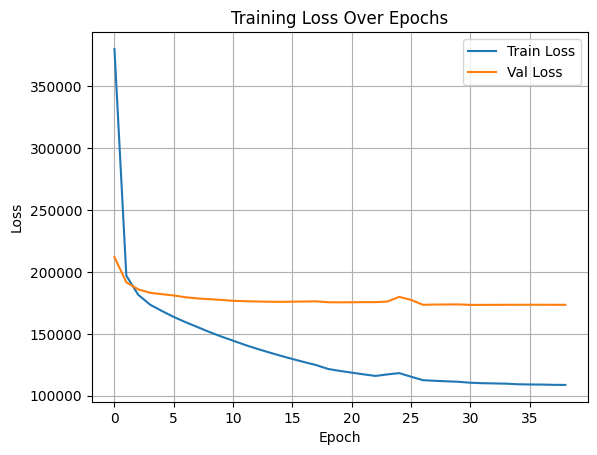

In [ ]:
plot_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


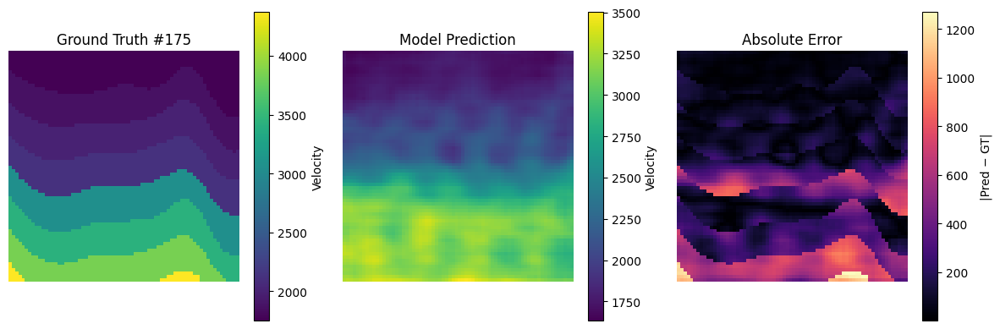

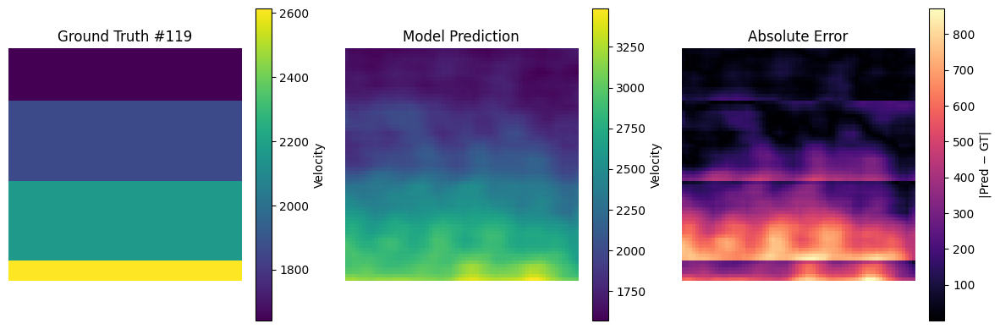

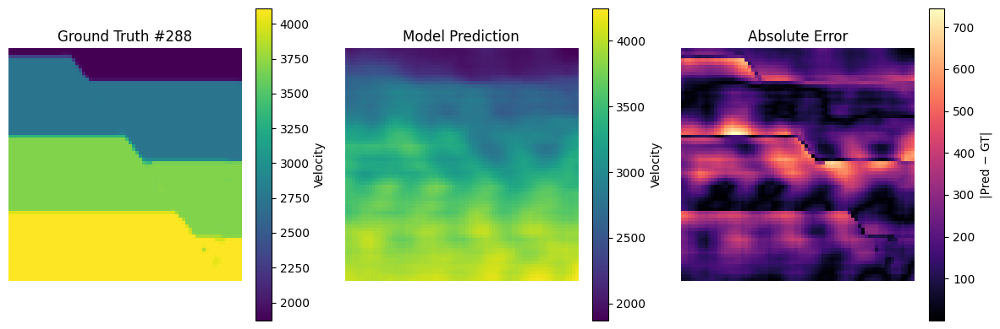

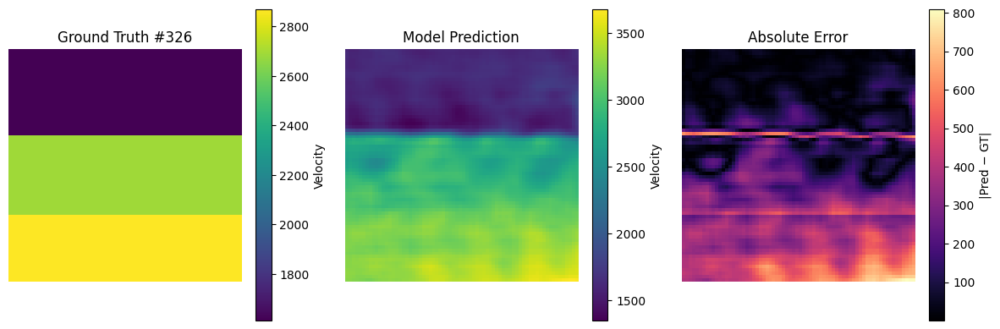

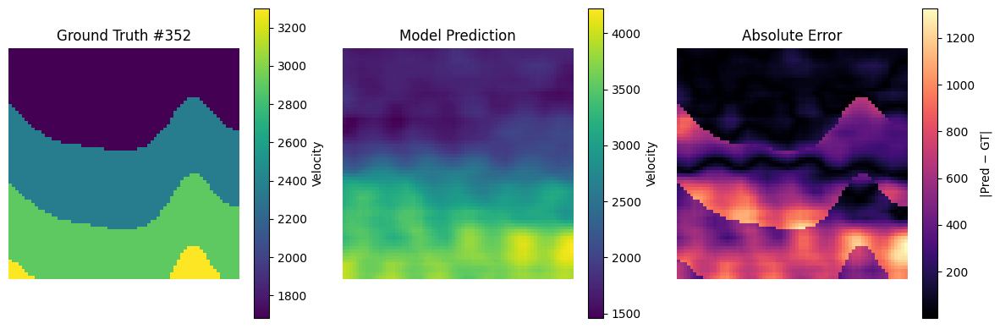

In [ ]:
X_val_np, y_val_np = extract_numpy_from_dataset(val_ds, max_batches=3)
show_random_velocity_predictions(model, X_val_np, y_val_np, num_samples=5)


# Findings

1. **Smooth predictions vs. sharp ground truths**: The predicted velocity fields look blurry compared to the piecewise or sharp transitions in the ground truth. This suggests our model is favoring low-frequency patterns and failing to capture high-frequency details (edges, sharp interfaces, thin layers).

2. **Absolute error maps**: Errors are concentrated near sharp boundaries in the ground truth—another indicator that the model isn't resolving those transitions well.


Even though your decoder uses residual blocks, skip connections from earlier transformer embeddings (or directly from input) could help reintroduce fine spatial details.


In [18]:
!cp /content/drive/MyDrive/CU/waveform-data/model_phase_unet_8_blocks_4a_new_loss.keras /content/

In [21]:
curriculum_phases = [
    [  # Phase 3: Full complexity (faults, style variations) + Phase 2 + Phase 1
    ['FlatVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['FlatFault_A', 'seis2_1_0.npy', 'vel2_1_0.npy', 'medium'],
        ['FlatFault_A', 'seis4_1_0.npy', 'vel4_1_0.npy', 'medium'],
        ['CurveVel_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['CurveVel_B', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['Style_A', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['Style_B', 'data/data1.npy', 'model/model1.npy', 'easy'],
        ['CurveFault_A', 'seis2_1_0.npy', 'vel2_1_0.npy', 'medium'],
        ['CurveFault_A', 'seis4_1_0.npy', 'vel4_1_0.npy', 'medium'],
        ['CurveFault_B', 'seis6_1_0.npy', 'vel6_1_0.npy', 'medium'],
        ['CurveFault_B', 'seis8_1_0.npy', 'vel8_1_0.npy', 'medium'],
    ]
]


callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    EarlyStopping(patience=8, restore_best_weights=True, verbose=1)
    #ModelCheckpoint(os.path.join(save_dir,"model_checkpoints_2_tpu.keras"), save_best_only=True, monitor="val_loss", verbose=1) # Removing this as its slowing things down
]
model = build_complex_model(input_shape=(70,1000,5),embed_dim=2048,num_blocks=12)
model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss=composite_loss(lambda_tv=0.0001, lambda_grad=1),
        metrics=[reconstruction_loss]
    )


In [22]:
#with strategy.scope():
model.load_weights('/content/model_phase_unet_8_blocks_4a_new_loss.keras')
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 420 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Model: "ComplexWaveformToVelocity"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 70, 1000,  │          0 │ -                 │
│ (InputLayer)        │ 5)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 70, 5000)  │          0 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ temporal_embedding  │ (None, 70, 2048)  │ 10,385,408 │ reshape[0][0]     │
│ (TemporalEmbedding) │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional          │ (None, 70, 2048)  │ 69,243,392 │ temporal_embeddi… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 70, 2048)  │ 69,243,392 │ functional[0][0]  │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_2        │ (None, 70, 2048)  │ 69,243,392 │ functional_1[0][… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_3        │ (None, 70, 2048)  │ 69,243,392 │ functional_2[0][… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_4        │ (None, 70, 2048)  │ 69,243,392 │ functional_3[0][… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_5        │ (None, 70, 2048)  │ 69,243,392 │ functional_4[0][… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_6        │ (None, 70, 2048)  │ 69,243,392 │ functional_5[0][… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_7        │ (None, 70, 2048)  │ 69,243,392 │ functional_6[0][… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_8        │ (None, 70, 2048)  │ 69,243,392 │ functional_7[0][… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_9        │ (None, 70, 2048)  │ 69,243,392 │ functional_8[0][… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_10       │ (None, 70, 2048)  │ 69,243,392 │ functional_9[0][… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_11       │ (None, 70, 2048)  │ 69,243,392 │ functional_10[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 70, 4096)  │          0 │ functional_11[0]… │
│ (Concatenate)       │                   │            │ temporal_embeddi… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 10, 14,    │          0 │ concatenate[0][0] │
│                     │ 2048)             │            │                 

 Total params: 855,316,353 (3.19 GB)

 Trainable params: 855,316,353 (3.19 GB)

 Non-trainable params: 0 (0.00 B)

In [23]:
def prepare_tf_dataset(X, y):
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
    y_train = np.transpose(y_train, (0, 2, 3, 1))  # (B, H, W, 1)
    y_val = np.transpose(y_val, (0, 2, 3, 1))
    train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return train_ds, val_ds

In [24]:
X_phase, y_phase = load_phase_data(curriculum_phases[0], work_dir)
X_phase_norm = normalize_waveforms(X_phase)
X_phase_norm = np.transpose(X_phase_norm, (0, 3, 2, 1))  # (N, 70, 1000, 5)
BATCH_SIZE=16
train_ds, val_ds = prepare_tf_dataset(X_phase_norm, y_phase)

EPOCHS_PER_PHASE = 500

To improve the blurrness and to reconstruct seismic velocity fields that are both physically possible, we designed a composite loss function that balances multiple objectives: reconstruction fidelity, edge preservation, spatial smoothness, structural similarity, and interpretability.

* **Sharp transitions** in the velocity field (e.g., faults, layer boundaries)
* **Homogeneous regions** (e.g., consistent rock layers)
* **Multi-modal distribution** of velocity values (common in geophysical models)
* **Perceptual similarity** to the true velocity map


## **Loss Components and Justifications**

**RMSE Loss (Reconstruction Loss)**: RMSE measures the average magnitude of errors between predicted and true values. This is a standard function in image reconstruction due .

**Gradient Loss**: Encourages the preservation of edges by penalizing the differences in gradients between predicted and true images (Abrahamyan et all 2022).  To accomplish this we use Sobel edge detection over both x and y dimensions.

Abrahamyan, L., Truong, A. M., Philips, W., & Deligiannis, N. (2022). Gradient Variance Loss for Structure-Enhanced Image Super-Resolution. arXiv preprint arXiv:2202.00997.
arXiv

**Total Variation Loss**: Promotes smoothness in the reconstructed image while preserving edges by penalizing the total variation (Rudin et all, 1992). This helps promote homogeneous regions.

**SSIM Loss (Structural Similarity Index)**: This measures perceptual similarity between images by considering luminance, constrast, and structure information (Zhao et all, 2017).



**Collapse Loss (Regularization for Value Clustering)**: This encourages the model to produce outputs that cluster around expected discrete values, i.e. moving away from the blurryness to more homogenous areas (Zhang et all 2023).




**Weighted Composition**

Weights chosen empirically:

* `λ_grad = 5.0`: Strong emphasis on **edge preservation**
* `λ_tv = 0.0005`: Mild regularization for **smoothness**
* `λ_ssim = 20.0`: High emphasis on perceptual quality
* `λ_collapse = 5.0`: Encourages homogenous areas without dominating the gradient


In [25]:
import tensorflow as tf
from tensorflow.image import ssim

def safe_normalize(x):
    min_val = tf.reduce_min(x)
    max_val = tf.reduce_max(x)
    return tf.cond(
        tf.less(max_val - min_val, 1e-5),
        lambda: tf.zeros_like(x),
        lambda: (x - min_val) / (max_val - min_val + 1e-6)
    )

def ssim_loss(y_true, y_pred):
    y_true_norm = safe_normalize(y_true)
    y_pred_norm = safe_normalize(y_pred)

    if y_true_norm.shape[-1] != 1:
        y_true_norm = tf.reduce_mean(y_true_norm, axis=-1, keepdims=True)
        y_pred_norm = tf.reduce_mean(y_pred_norm, axis=-1, keepdims=True)

    return 1 - tf.reduce_mean(ssim(y_true_norm, y_pred_norm, max_val=1.0))


def total_variation_loss(x):
    return tf.reduce_mean(tf.image.total_variation(x))

def gradient_loss(y_true, y_pred):
    grad_true = tf.image.sobel_edges(y_true)
    grad_pred = tf.image.sobel_edges(y_pred)
    return tf.reduce_mean(tf.abs(grad_true - grad_pred))

def collapse_loss(y_pred):
    y_pred = tf.where(tf.math.is_nan(y_pred), tf.zeros_like(y_pred), y_pred)
    centers = tf.constant([1.5, 2.0, 2.5], dtype=tf.float32)
    diff = tf.abs(y_pred[..., None] - centers)
    min_dist = tf.reduce_min(diff, axis=-1)
    return tf.reduce_mean(min_dist)

def rmse_loss(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))



def composite_loss(lambda_tv=0.0005, lambda_grad=5.0, lambda_ssim=20.0, lambda_collapse=5.0):
    def loss(y_true, y_pred):

        recon = rmse_loss(y_true, y_pred)
        grad = gradient_loss(y_true, y_pred)
        tv = total_variation_loss(y_pred)
        ssim_l = ssim_loss(y_true, y_pred)
        collapse = collapse_loss(y_pred)

        #tf.print("recon:", recon, "grad:", grad, "tv:", tv, "ssim:", ssim_l,"collapse:", collapse) # Use for DEBUG only

        return tf.cast(recon + lambda_grad * grad + lambda_tv * tv + lambda_ssim * ssim_l+ lambda_collapse * collapse, tf.float32)
    return loss


In [26]:
model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss=composite_loss(),
        metrics=[reconstruction_loss]
    )

# Just one batch for debugging
for x_batch, y_batch in val_ds.take(1):
    break
y_pred = model.predict(x_batch)

x_tensor = tf.convert_to_tensor(x_batch, dtype=tf.float32)
y_true = tf.convert_to_tensor(y_batch, dtype=tf.float32)
y_pred_tensor = tf.convert_to_tensor(y_pred, dtype=tf.float32)
def print_stats(name, tensor):
  tf.print(f"{name} - min:", tf.reduce_min(tensor),
            "max:", tf.reduce_max(tensor),
            "mean:", tf.reduce_mean(tensor),
            "stddev:", tf.math.reduce_std(tensor))

print_stats("y_true", y_true)
print_stats("y_pred", y_pred)

loss_fn = composite_loss(lambda_tv=0.0001, lambda_grad=1.0, lambda_ssim=0.5)

loss_value = loss_fn(y_true, y_pred_tensor)
print("Composite Loss:", loss_value.numpy())
recon = tf.reduce_mean(tf.square(y_true - y_pred_tensor)).numpy()
grad = gradient_loss(y_true, y_pred_tensor).numpy()
tv = total_variation_loss(y_pred_tensor).numpy()
ssim_l = ssim_loss(y_true, y_pred_tensor).numpy()
collapse = collapse_loss(y_pred).numpy()
print(f"Recon: {recon:.6f}, Grad: {grad:.6f}, TV: {tv:.6f}, SSIM: {ssim_l:.6f}, collapse = {collapse:.6f}")

y_true = tf.clip_by_value(y_true, 0.0, 10.0)
y_pred = tf.clip_by_value(y_pred, 0.0, 10.0)

recon = tf.reduce_mean(tf.square(y_true - y_pred))
tf.print("RECON OK:", recon)

# Check gradient loss term
try:
    grad = gradient_loss(y_true, y_pred)
    tf.print("GRAD OK:", grad)
except Exception as e:
    print("Gradient loss failed:", e)

# Check total variation
try:
    tv = total_variation_loss(y_pred)
    tf.print("TV OK:", tv)
except Exception as e:
    print("TV failed:", e)

# Check SSIM
try:
    ssim_l = ssim_loss(y_true, y_pred)
    tf.print("SSIM OK:", ssim_l)
except Exception as e:
    print("SSIM failed:", e)

# Check collapse (already okay)
collapse = collapse_loss(y_pred)
tf.print("COLLAPSE OK:", collapse)

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
y_true - min: 1531 max: 4466 mean: 2747.38696 stddev: 807.727051
y_pred - min: 1224.07202 max: 4896.48242 mean: 2708.41724 stddev: 744.210876
Composite Loss: 14216.355
Recon: 106629.242188, Grad: 333.114319, TV: 269152.468750, SSIM: 0.396501, collapse = 2705.917236
RECON OK: 0
GRAD OK: 0
TV OK: 0
SSIM OK: 0
COLLAPSE OK: 7.5


In [ ]:
EPOCHS_PER_PHASE = 500
with strategy.scope():
  history = model.fit(
      train_ds,
      validation_data=val_ds,
      epochs=EPOCHS_PER_PHASE,
      callbacks=callbacks
  )

model.save(os.path.join(save_dir,f'model_phase_unet_8_blocks_4a_new_loss.keras'))

print(f"Completed Phase.\n")

Epoch 1/500
550/550 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step - loss: 184521.0625 - reconstruction_loss: 183881.0312
Epoch 1: val_loss improved from inf to 202033.79688, saving model to /content/drive/MyDrive/CU/waveform-data/model_checkpoints_2_tpu.keras
550/550 ━━━━━━━━━━━━━━━━━━━━ 463s 725ms/step - loss: 184495.0156 - reconstruction_loss: 183855.0000 - val_loss: 202033.7969 - val_reconstruction_loss: 201209.2188 - learning_rate: 1.0000e-04
Epoch 2/500
550/550 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step - loss: 566074.6875 - reconstruction_loss: 565322.5000
Epoch 2: val_loss did not improve from 202033.79688
550/550 ━━━━━━━━━━━━━━━━━━━━ 174s 316ms/step - loss: 565792.8125 - reconstruction_loss: 565040.6875 - val_loss: 233780.0938 - val_reconstruction_loss: 232986.6250 - learning_rate: 1.0000e-04
Epoch 3/500
550/550 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step - loss: 227184.6875 - reconstruction_loss: 226577.2188
Epoch 3: val_loss did not improve from 202033.79688
550/550 ━━━━━━━━━━━━━━━━━━━━ 173s 315ms/step 

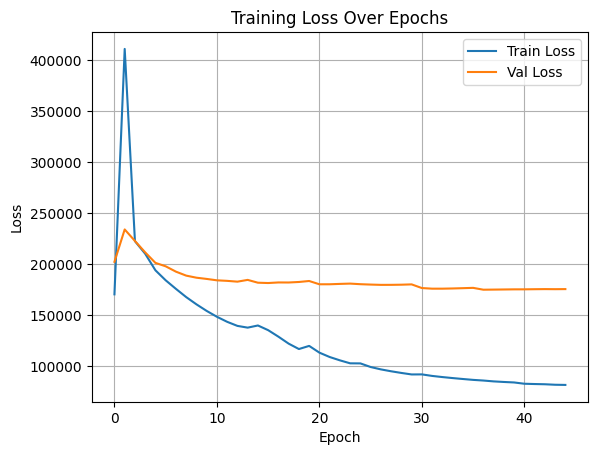

In [ ]:
plot_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


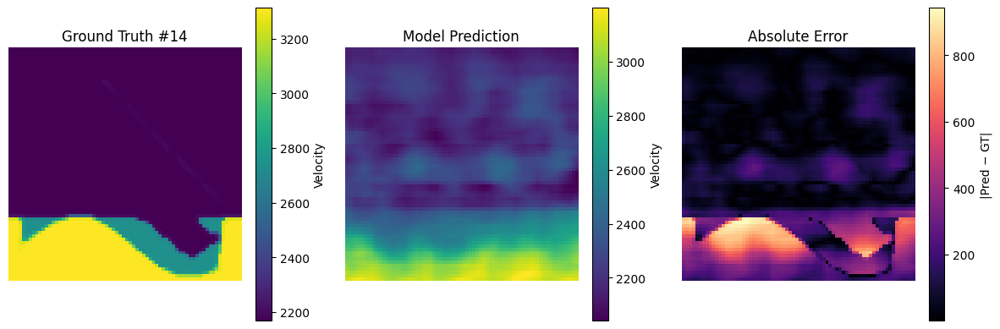

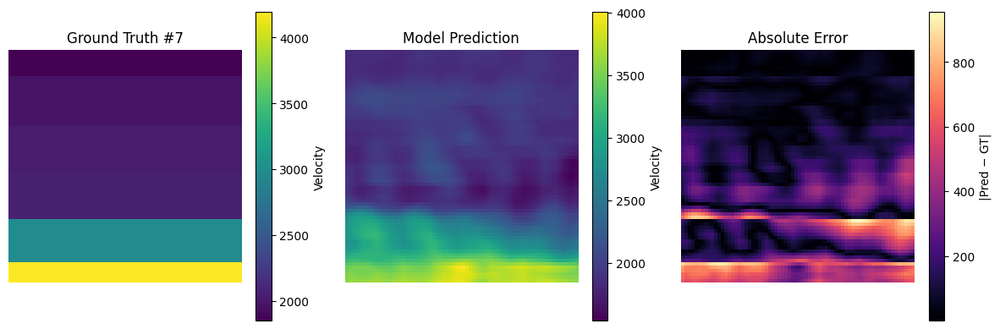

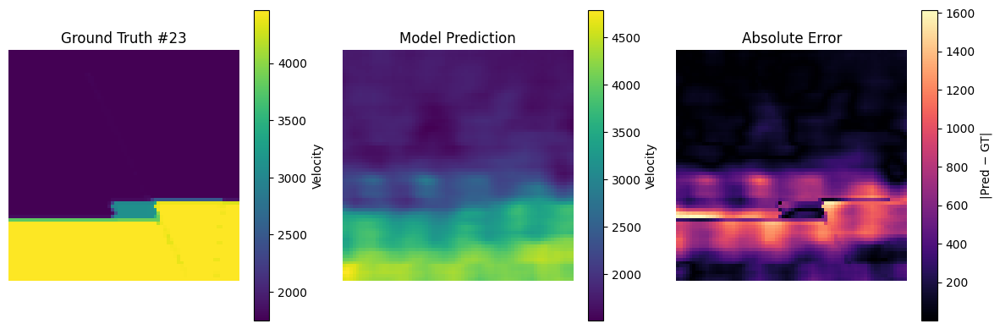

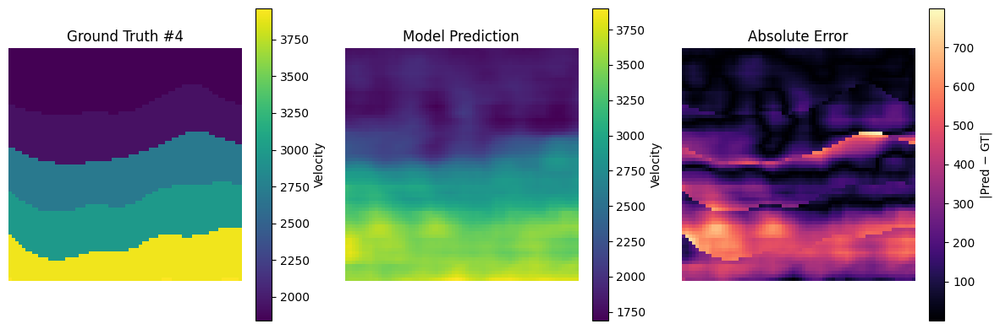

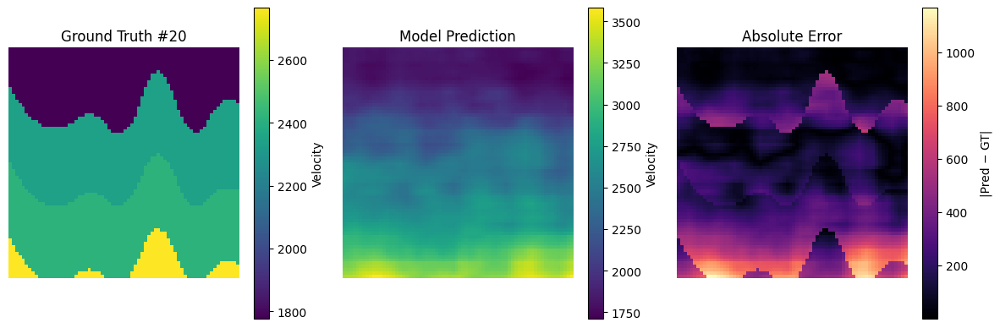

In [ ]:
X_val_np, y_val_np = extract_numpy_from_dataset(val_ds, max_batches=3)
show_random_velocity_predictions(model, X_val_np, y_val_np, num_samples=5)

In [28]:
EPOCHS_PER_PHASE = 500

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_PER_PHASE,
    callbacks=callbacks
)

model.save(os.path.join(save_dir,f'model_phase_unet_8_blocks_4b_new_loss.keras'))

print(f"Completed Phase.\n")

Epoch 1/500
275/275 ━━━━━━━━━━━━━━━━━━━━ 201s 503ms/step - loss: 5216.8706 - reconstruction_loss: 8417516.0000 - val_loss: 4336.3486 - val_reconstruction_loss: 9152124.0000 - learning_rate: 1.0000e-04
Epoch 2/500
275/275 ━━━━━━━━━━━━━━━━━━━━ 126s 457ms/step - loss: 4351.8428 - reconstruction_loss: 9273450.0000 - val_loss: 4335.6270 - val_reconstruction_loss: 9152160.0000 - learning_rate: 1.0000e-04
Epoch 3/500
275/275 ━━━━━━━━━━━━━━━━━━━━ 126s 457ms/step - loss: 4351.3379 - reconstruction_loss: 9273556.0000 - val_loss: 4335.2598 - val_reconstruction_loss: 9152250.0000 - learning_rate: 1.0000e-04
Epoch 4/500
275/275 ━━━━━━━━━━━━━━━━━━━━ 125s 456ms/step - loss: 4351.0059 - reconstruction_loss: 9273623.0000 - val_loss: 4335.2031 - val_reconstruction_loss: 9152164.0000 - learning_rate: 1.0000e-04
Epoch 5/500
275/275 ━━━━━━━━━━━━━━━━━━━━ 126s 457ms/step - loss: 4350.6968 - reconstruction_loss: 9273617.0000 - val_loss: 4334.7900 - val_reconstruction_loss: 9151914.0000 - learning_rate: 1.0000

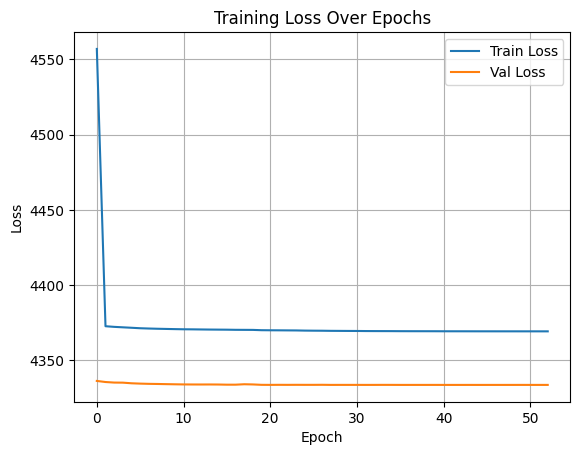

In [29]:
plot_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


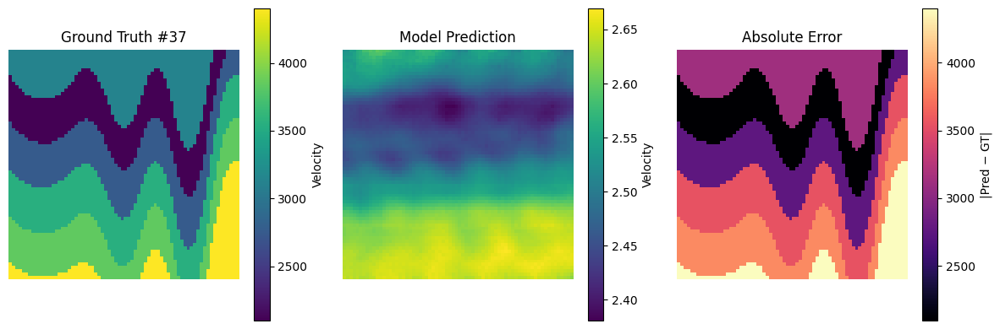

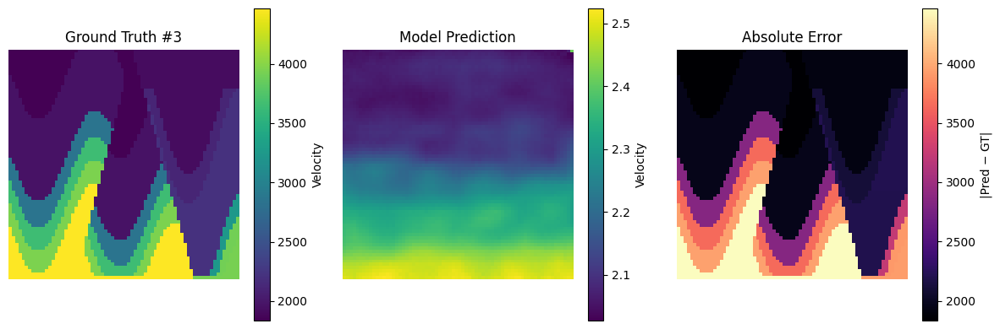

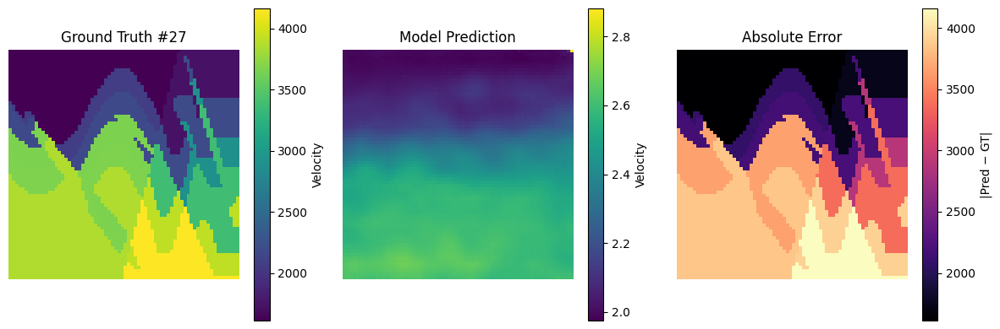

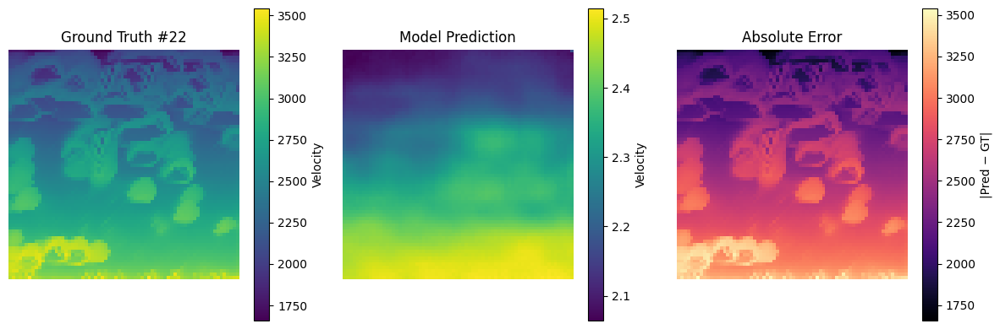

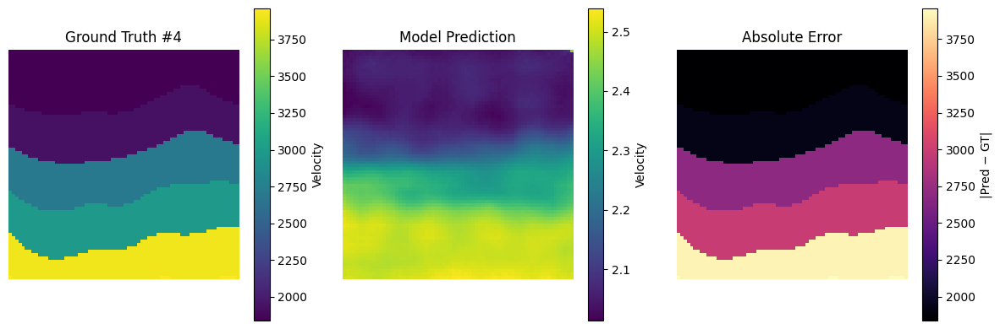

In [30]:
X_val_np, y_val_np = extract_numpy_from_dataset(val_ds, max_batches=3)
show_random_velocity_predictions(model, X_val_np, y_val_np, num_samples=5)

## Model Performance and Observations

Our final model demonstrates improvements over initial attempts, especially in reconstructing basic velocity regions and distinguishing between velocity regions. However, several challenges remain before it can be considered reliable for practical subsurface modeling:

The most impactful future improvement lies in designing better loss functions: particularly ones that incorporate physical constraints.

While our composite loss (RMSE + Gradient + SSIM + TV + Collapse) provided a balanced foundation, it is agnostic to the physics of wave propagation. Incorporating physics-informed losses; could provide a more meaningful optimization signal, especially for training on complex or low-data regimes.


## **Final Findings and Results**

Our exploration into deep learning for seismic waveform inversion led to several key findings across architecture design, learning strategy, and loss formulation.

### **1. Loss Function Trade-offs**

The most significant challenge we encountered was designing a loss function that could simultaneously: Preserve sharp boundaries, Reconstruct homogeneous regions (e.g., uniform layers), and avoid oversmoothing.

We experimented with several combinations of losses:

* **Reconstruction loss (MSE/RMSE)** provided a general fidelity signal but often led to blurry outputs in complex regions.
* **Total Variation (TV) loss** effectively smoothed homogeneous areas but suppressed small-scale features in datasets with high geological complexity.
* **Gradient loss** helped retain edge details, improving visual quality in faulted regions.
* **SSIM loss** encouraged perceptual similarity and maintained structural integrity, especially in cleaner datasets.
* A **collapse loss** was introduced to bias outputs toward discrete, interpretable velocity levels—improving convergence in early training and helping avoid degenerate solutions.

Despite these efforts, no single combination perfectly handled both extremes of the spectrum (flat vs. highly faulted models), reinforcing the need for **domain-adaptive or multi-objective optimization techniques** in future work.

### **2. Curriculum Learning Strategy**

We adopted a curriculum learning approach, training models progressively across three phases:

* **Phase 1**: Simple horizontally layered velocity maps (`FlatVel_A`, `FlatFault_A`)
* **Phase 2**: Introduced curvature and moderate complexity (`CurveVel_A/B`, `FlatFault_B`)
* **Phase 3**: Included highly complex maps with faults and irregular layering (`Style_A/B`, `CurveFault_B`)

Rather than resetting training with each phase, we accumulated data:

* Phase 2 used Phase 1 + 2 data,
* Phase 3 used all phases.

### **3. Model Architecture Experiments**

We tested several architectures:

#### **Baseline CNN Decoder**

A CNN decoder performed reasonably on simple datasets but lacked the ability to model long-range temporal dependencies present in waveform inputs.

#### **Transformer-based Temporal Encoder + CNN Decoder**

Our best-performing architecture combined:

* A **temporal Transformer encoder** with learnable positional embeddings to capture the global evolution of wavefronts,
* A **U-Net–style CNN decoder** with skip connections to reconstruct high-resolution velocity maps from compressed embeddings.

This hybrid architecture allowed the model to capture both **global temporal dynamics** and **local spatial detail**, which was critical in modeling seismic energy propagation and geological transitions.

### **4. Hyperparameter Tuning Insights**

We performed limited but targeted hyperparameter tuning:

* **Embedding dimensions**: 128 worked well, while higher values marginally improved performance at the cost of stability.
* **Loss function weights**: Increasing `λ_gradient` and `λ_ssim` improved edge fidelity and visual sharpness but required careful balancing to prevent training collapse.
* **Learning rate scheduling** and **early stopping** were essential to prevent overfitting in late phases of training.

### **5. EDA-Driven Insights**

Our EDA confirmed that:

* **Waveform PCA arc length** and **correlation entropy** correlate with geological complexity.
* Flat datasets exhibit high temporal coherence and spatial regularity.
* Faulted/curved datasets produce complex, chaotic wavefront behavior that’s harder to model.

These metrics were critical in designing our curriculum and loss formulations.


Seismic waveform inversion using deep learning remains a challenging task, especially when balancing **sharpness and smoothness** in the predicted velocity maps. Curriculum learning and hybrid Transformer-CNN architectures show strong promise, but future work must focus on **adaptive loss functions**, **domain-conditioned learning**, and potentially **multi-resolution objectives** to fully capture the geological variance in waveform datasets.

## Key Learnings & Future Work

One of the most critical findings in this project was the central role of the loss function in learning realistic velocity maps. We observed that:

* Pixel-based losses like MSE or RMSE often lead to blurred reconstructions, especially in complex, faulted regions.
* Structural losses like gradient and SSIM help with edge preservation but require careful balancing to avoid suppressing large-scale smooth areas.
* Adding collapse loss encouraged convergence to physically plausible velocity ranges but was insufficient to generalize across all scenarios.

### Future Direction: Physics-Integrated Losses

A promising path forward is to develop or incorporate **physics-informed loss functions** — for example, losses derived from the wave equation or finite-difference residuals. These could be used in combination with traditional reconstruction losses to guide the model toward **physically valid outputs**, not just numerically close ones.

Moreover, embedding these constraints directly into the optimizer or training loop could enhance convergence and generalization, especially in regimes with limited data or high structural complexity.

**Key Insight:** Learning seismic inversion is not just about designing architectures: it's about designing the right objective.

This makes loss function engineering arguably more important than model depth or width in physics-constrained domains like geophysics.

#Reference

Wei, S. (n.d.). Seismic time series data. Michigan State University. Retrieved May 16, 2025, from https://sites.google.com/msu.edu/wei-seismic-training/seismic-time-series-data

Dahal A, Tanyaş H, Lombardo L. Full seismic waveform analysis combined with transformer neural networks improves coseismic landslide prediction. Communications Earth & Environment. 2024;5(1):75. doi:10.1038/s43247-024-01243-8

Ding, Y., Chen, S., Miyake, H., & Li, X. (2024). Physics-informed neural networks with Fourier features for seismic wavefield simulation in time-domain nonsmooth complex media. arXiv. https://doi.org/10.48550/arXiv.2409.03536
arXiv

Bengio, Y., Louradour, J., Collobert, R., & Weston, J. (2009). Curriculum learning. Proceedings of the 26th Annual International Conference on Machine Learning (pp. 41–48). ACM. https://doi.org/10.1145/1553374.1553380

Weinshall, D., Cohen, G., & Amir, D. (2018). Curriculum learning by transfer learning: Theory and experiments with deep networks. arXiv preprint arXiv:1802.03796. https://arxiv.org/abs/1802.03796

Rudin, L. I., Osher, S., & Fatemi, E. (1992). Nonlinear total variation based noise removal algorithms. Physica D: Nonlinear Phenomena, 60(1-4), 259–268.

Zhao, H., Gallo, O., Frosio, I., & Kautz, J. (2017). Loss Functions for Image Restoration with Neural Networks. IEEE Transactions on Computational Imaging, 3(1), 47–57.

Zhang, Y., & Dou, Q. (2023). Anti-Collapse Loss for Deep Metric Learning Based on Coding Rate Reduction. arXiv preprint arXiv:2407.03106.

OpenAI. (2025). ChatGPT (May 16 version) [Large language model]. https://chat.openai.com/

